# INN Hotels Project

## Context

A significant number of hotel bookings are called-off due to cancellations or no-shows. The typical reasons for cancellations include change of plans, scheduling conflicts, etc. This is often made easier by the option to do so free of charge or preferably at a low cost which is beneficial to hotel guests but it is a less desirable and possibly revenue-diminishing factor for hotels to deal with. Such losses are particularly high on last-minute cancellations. 

The new technologies involving online booking channels have dramatically changed customers’ booking possibilities and behavior. This adds a further dimension to the challenge of how hotels handle cancellations, which are no longer limited to traditional booking and guest characteristics. 

The cancellation of bookings impact a hotel on various fronts:
* Loss of resources (revenue) when the hotel cannot resell the room.
* Additional costs of distribution channels by increasing commissions or paying for publicity to help sell these rooms.
* Lowering prices last minute, so the hotel can resell a room, resulting in reducing the profit margin.
* Human resources to make arrangements for the guests.

## Objective
The increasing number of cancellations calls for a Machine Learning based solution that can help in predicting which booking is likely to be canceled. INN Hotels Group has a chain of hotels in Portugal, they are facing problems with the high number of booking cancellations and have reached out to your firm for data-driven solutions. You as a data scientist have to analyze the data provided to find which factors have a high influence on booking cancellations, build a predictive model that can predict which booking is going to be canceled in advance, and help in formulating profitable policies for cancellations and refunds.

## Data Description
The data contains the different attributes of customers' booking details. The detailed data dictionary is given below.


**Data Dictionary**

* Booking_ID: unique identifier of each booking
* no_of_adults: Number of adults
* no_of_children: Number of Children
* no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
* no_of_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
* type_of_meal_plan: Type of meal plan booked by the customer:
    * Not Selected – No meal plan selected
    * Meal Plan 1 – Breakfast
    * Meal Plan 2 – Half board (breakfast and one other meal)
    * Meal Plan 3 – Full board (breakfast, lunch, and dinner)
* required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
* room_type_reserved: Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
* lead_time: Number of days between the date of booking and the arrival date
* arrival_year: Year of arrival date
* arrival_month: Month of arrival date
* arrival_date: Date of the month
* market_segment_type: Market segment designation.
* repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
* no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
* no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
* avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
* no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
* booking_status: Flag indicating if the booking was canceled or not.

## Importing necessary libraries and data

In [1]:
# Importing appropriate libraries

# For loading data and data processing
import numpy as np
import pandas as pd

# For visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# For splitting the data into train/test
from sklearn.model_selection import train_test_split

# For handling warnings
import warnings
warnings.filterwarnings("ignore")
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter("ignore", ConvergenceWarning)

# For building a logistic regression prediction model
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression

# For building a decision trees prediction model
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# For tuning decision tree
from sklearn.model_selection import GridSearchCV

# For performing statistical analysis
import scipy.stats as stats

# To get diferent metric scores (for both logistic regression and decision trees)
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
    make_scorer,
)

## Data Overview

- Observations
- Sanity checks

In [2]:
# Reading in data into a datframe
df = pd.read_csv("INNHotelsGroup.csv")
df

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled


In [3]:
# Viewing first five rows
df.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [4]:
# Viewing a sample of the data
df.sample(10)

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
18226,INN18227,2,1,2,3,Meal Plan 1,0,Room_Type 1,5,2018,3,26,Online,0,0,0,145.00,1,Not_Canceled
22851,INN22852,1,0,0,1,Meal Plan 1,0,Room_Type 1,156,2018,8,11,Online,0,0,0,108.90,0,Canceled
9369,INN09370,2,0,2,2,Not Selected,0,Room_Type 1,38,2018,8,27,Online,0,0,0,107.55,2,Not_Canceled
4092,INN04093,2,0,0,3,Meal Plan 2,0,Room_Type 1,34,2017,9,23,Online,0,0,0,224.67,0,Canceled
9698,INN09699,2,0,0,2,Meal Plan 2,0,Room_Type 1,265,2018,6,24,Offline,0,0,0,115.00,1,Canceled
14154,INN14155,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Offline,0,0,0,100.00,0,Canceled
27736,INN27737,2,0,1,3,Meal Plan 1,0,Room_Type 2,62,2018,2,15,Online,0,0,0,65.66,1,Not_Canceled
5081,INN05082,1,0,0,2,Meal Plan 1,0,Room_Type 1,164,2017,10,2,Offline,0,0,0,100.00,0,Not_Canceled
3955,INN03956,2,0,2,3,Meal Plan 1,0,Room_Type 1,256,2018,10,16,Online,0,0,0,100.75,0,Canceled
5176,INN05177,3,0,2,1,Meal Plan 1,0,Room_Type 4,103,2018,8,7,Online,0,0,0,150.30,1,Not_Canceled


In [5]:
# Shape of the dataframe
print(f"The shape of the dataframe is {df.shape}. \nThere are {df.shape[0]} rows and {df.shape[1]} columns")

The shape of the dataframe is (36275, 19). 
There are 36275 rows and 19 columns


In [6]:
# Datatypes in dataframe
print(df.dtypes)

Booking_ID                               object
no_of_adults                              int64
no_of_children                            int64
no_of_weekend_nights                      int64
no_of_week_nights                         int64
type_of_meal_plan                        object
required_car_parking_space                int64
room_type_reserved                       object
lead_time                                 int64
arrival_year                              int64
arrival_month                             int64
arrival_date                              int64
market_segment_type                      object
repeated_guest                            int64
no_of_previous_cancellations              int64
no_of_previous_bookings_not_canceled      int64
avg_price_per_room                      float64
no_of_special_requests                    int64
booking_status                           object
dtype: object


In [7]:
# Making a copy of the original dataframe to preserve the original data
df1 = df.copy()

In [8]:
# Converting Booking_ID, type_of_meal_plan, room_type_reserved, market_segment_type, and booking_status to categorical type from object type
cols = ["Booking_ID", "type_of_meal_plan", "room_type_reserved", "market_segment_type", "booking_status"]
df1[cols] = df1[cols].astype("category")

In [9]:
# Confirming that datatype convesion was successful and there are no more object datatypes
print(df1.dtypes)

Booking_ID                              category
no_of_adults                               int64
no_of_children                             int64
no_of_weekend_nights                       int64
no_of_week_nights                          int64
type_of_meal_plan                       category
required_car_parking_space                 int64
room_type_reserved                      category
lead_time                                  int64
arrival_year                               int64
arrival_month                              int64
arrival_date                               int64
market_segment_type                     category
repeated_guest                             int64
no_of_previous_cancellations               int64
no_of_previous_bookings_not_canceled       int64
avg_price_per_room                       float64
no_of_special_requests                     int64
booking_status                          category
dtype: object


In [10]:
# Determining if there are any missing values in the dataframe
# Total missing values for each column sorted in descending order
print(df1.isnull().sum().sort_values(ascending=False))

Booking_ID                              0
arrival_month                           0
no_of_special_requests                  0
avg_price_per_room                      0
no_of_previous_bookings_not_canceled    0
no_of_previous_cancellations            0
repeated_guest                          0
market_segment_type                     0
arrival_date                            0
arrival_year                            0
no_of_adults                            0
lead_time                               0
room_type_reserved                      0
required_car_parking_space              0
type_of_meal_plan                       0
no_of_week_nights                       0
no_of_weekend_nights                    0
no_of_children                          0
booking_status                          0
dtype: int64


In [11]:
# Any missing values?
print("True or False, are there any missing values?", df1.isnull().values.any())

True or False, are there any missing values? False


In [12]:
# Total number of missing values (if any)
print("Total number of missing values (if any) is", df1.isnull().sum().sum())

Total number of missing values (if any) is 0


In [13]:
# Number of unique values in each column sorted in descending order
print(df1.nunique().sort_values(ascending=False))

Booking_ID                              36275
avg_price_per_room                       3930
lead_time                                 352
no_of_previous_bookings_not_canceled       59
arrival_date                               31
no_of_week_nights                          18
arrival_month                              12
no_of_previous_cancellations                9
no_of_weekend_nights                        8
room_type_reserved                          7
no_of_children                              6
no_of_special_requests                      6
no_of_adults                                5
market_segment_type                         5
type_of_meal_plan                           4
arrival_year                                2
repeated_guest                              2
required_car_parking_space                  2
booking_status                              2
dtype: int64


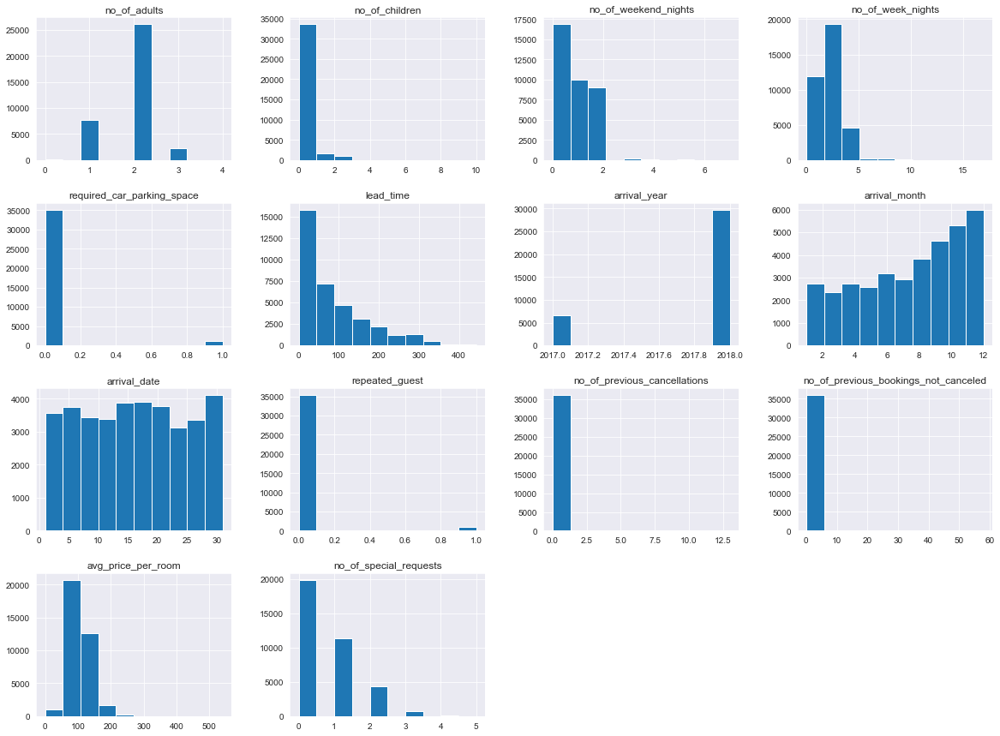

In [14]:
# Distribution of numerical variables
sns.set_style("darkgrid")
df1.hist(figsize = (20, 15))
plt.show()

In [15]:
# Statistical summary of all data
df1.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Booking_ID,36275,36275,INN00001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
no_of_adults,36275.0,NaN,NaN,NaN,1.844962,0.518715,0.0,2.0,2.0,2.0,4.0
no_of_children,36275.0,NaN,NaN,NaN,0.105279,0.402648,0.0,0.0,0.0,0.0,10.0
no_of_weekend_nights,36275.0,NaN,NaN,NaN,0.810724,0.870644,0.0,0.0,1.0,2.0,7.0
no_of_week_nights,36275.0,NaN,NaN,NaN,2.2043,1.410905,0.0,1.0,2.0,3.0,17.0
type_of_meal_plan,36275,4,Meal Plan 1,27835,NaN,NaN,NaN,NaN,NaN,NaN,NaN
required_car_parking_space,36275.0,NaN,NaN,NaN,0.030986,0.173281,0.0,0.0,0.0,0.0,1.0
room_type_reserved,36275,7,Room_Type 1,28130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lead_time,36275.0,NaN,NaN,NaN,85.232557,85.930817,0.0,17.0,57.0,126.0,443.0
arrival_year,36275.0,NaN,NaN,NaN,2017.820427,0.383836,2017.0,2018.0,2018.0,2018.0,2018.0


### Observations

* The dataset has 36275 rows and 19 columns
* Of the 19 columns, one is of type float64, thirteen are int64, and the remaining five are object datatypes, which will be converted to categorical to reduce space and be used for building the logistic regression and decision tree models.
    * Booking_ID,                               object
    * no_of_adults,                              int64
    * no_of_children,                            int64
    * no_of_weekend_nights,                      int64
    * no_of_week_nights,                         int64
    * type_of_meal_plan,                        object
    * required_car_parking_space,                int64
    * room_type_reserved,                       object
    * lead_time,                                 int64
    * arrival_year,                              int64
    * arrival_month,                             int64
    * arrival_date,                              int64
    * market_segment_type,                      object
    * repeated_guest,                            int64
    * no_of_previous_cancellations,              int64
    * no_of_previous_bookings_not_canceled,      int64
    * avg_price_per_room,                      float64
    * no_of_special_requests,                    int64
    * booking_status,                           object
* There are no missing values in the dataframe.
* The target variable (`booking_status`) doesn't have any missing values and is type category.
* The most common value for (`booking_status`) is (`Not_Canceled`), with 24,390 values, suggesting the data is imbalanced.

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

In [16]:
# function to plot a boxplot and a histogram along the same scale.

def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [17]:
# function to create labeled barplots

def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

## Univariate Analysis

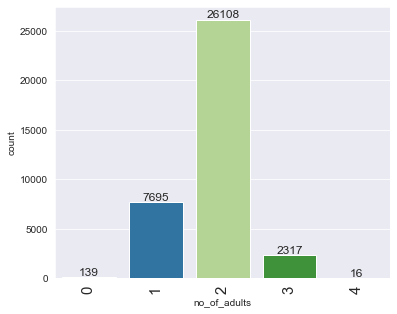

In [18]:
# Number of adults for a booking
labeled_barplot(df1, "no_of_adults")

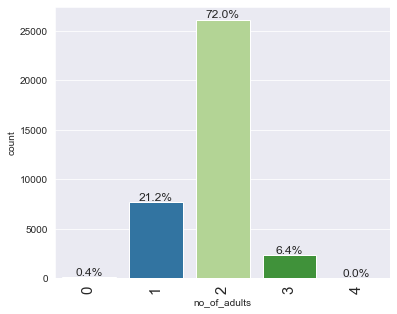

In [19]:
# Number of adults for a booking as a percentage
labeled_barplot(df1, "no_of_adults", perc = True)

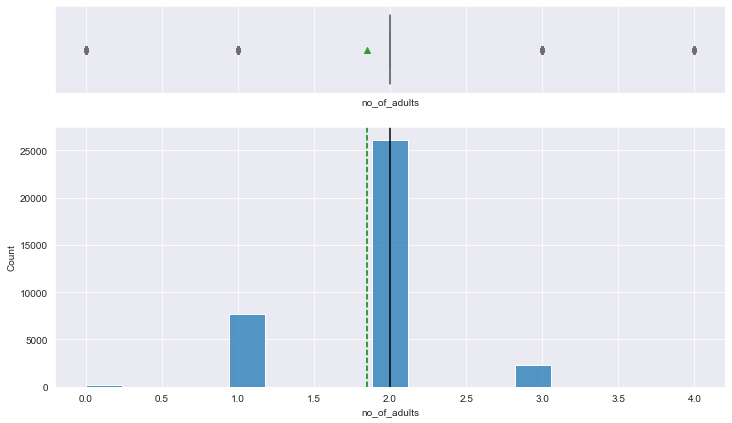

In [20]:
# Number of adults for a booking histogram and boxplot
histogram_boxplot(df1, "no_of_adults")

### Observations for number of adults
* The most frequent number of adults for bookings is 2 adults, which is 72% of the bookings.
* Second most frequent number of adults for booking is 1 adult, which is 21.2% of the bookings.
* The mean is less than the median, and the median is 2 adults. 
* Since more than 70% of the bookings are for 2 adults, there are outliers on both sides of the median.
* The data is imbalanced with most of the data for 2 adults.

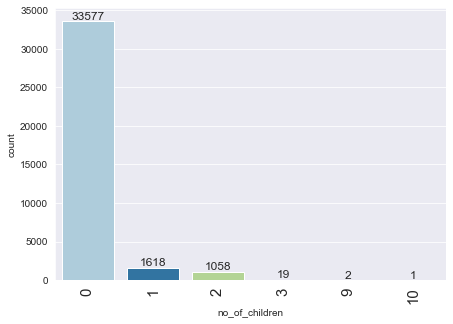

In [21]:
# Number of children for a booking
labeled_barplot(df1, "no_of_children")

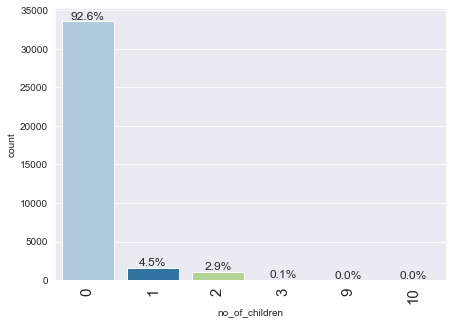

In [22]:
# Number of children for a booking as a percentage
labeled_barplot(df1, "no_of_children", perc = True)

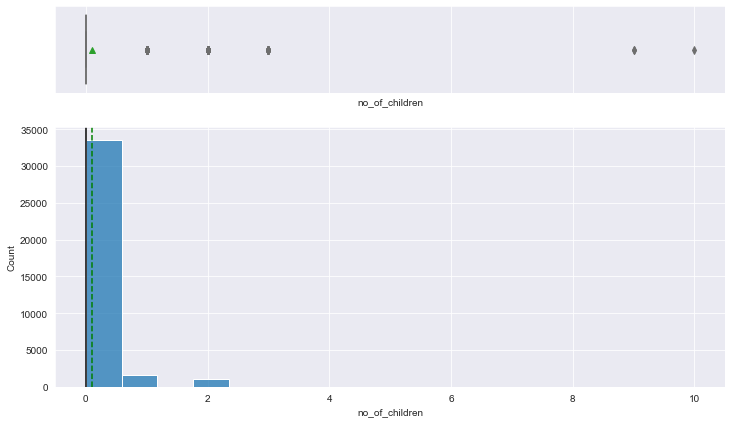

In [23]:
# Number of children for a booking histogram and boxplot
histogram_boxplot(df1, "no_of_children")

### Observations for number of children
* The most frequent number of children for bookings is 0 children, which is 92.6% of the bookings.
* Second most frequent number of children for booking is 1 child, which is 4.5% of the bookings.
* The mean is a little greater than the median, and the median is 0 kids. 
* Since more than 92% of the bookings are for 0 children, there are outliers to the right of the median.
* The data is imbalanced with most of the data for 0 children.

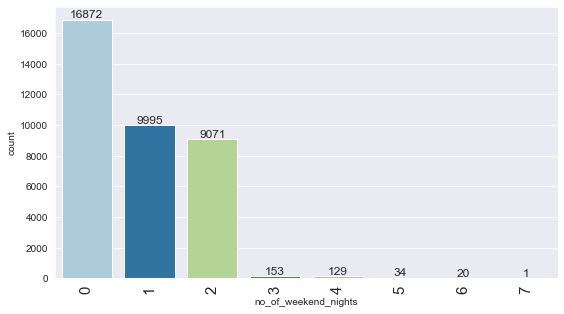

In [24]:
# Number of weekend nights for a booking
labeled_barplot(df1, "no_of_weekend_nights")

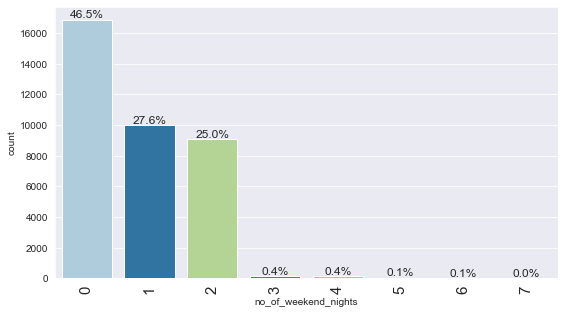

In [25]:
# Number of weekend nights for a booking as a percentage
labeled_barplot(df1, "no_of_weekend_nights", perc = True)

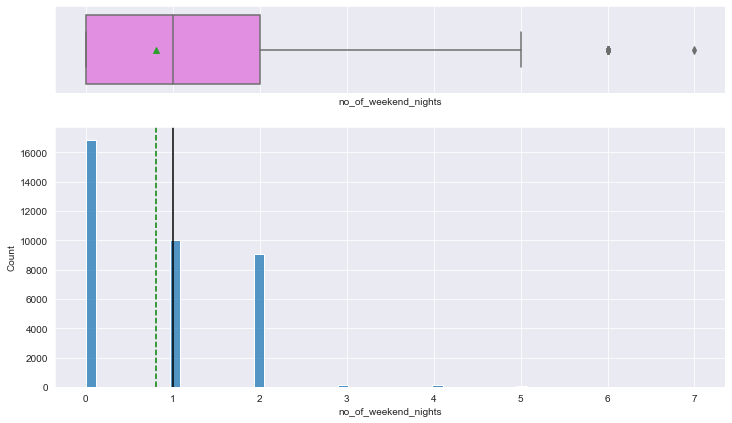

In [26]:
# Number of weekend nights for a booking histogram and boxplot
histogram_boxplot(df1, "no_of_weekend_nights")

### Observations for number of weekend nights
* The most frequent number of weekend nights for a booking is 0, which is 46.5% of the bookings.
* Second most frequent number of weekend nights for a booking is 1, which is 27.6% of the bookings.
* The mean is less than the median, and the median is 1 night.
* There are multiple outliers to the right of the boxplot.
* The data is imbalanced with most of the data for 0 weekend nights.

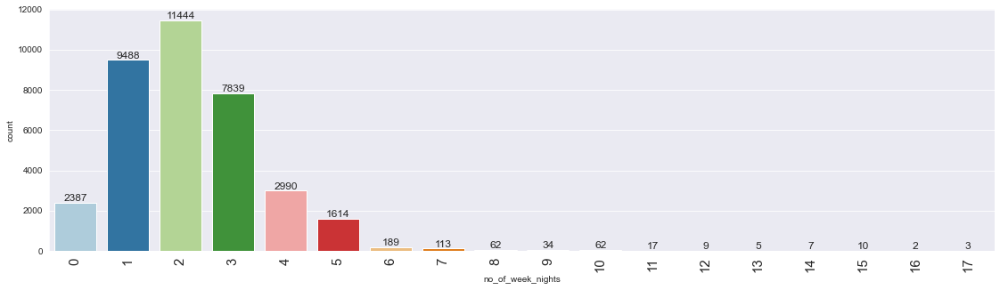

In [27]:
# Number of week nights for a booking
labeled_barplot(df1, "no_of_week_nights")

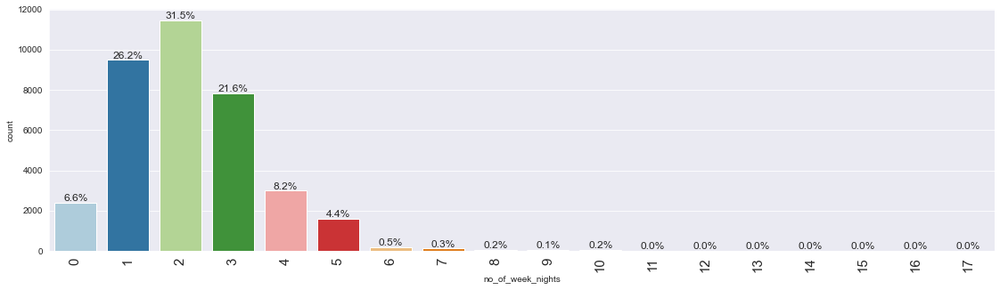

In [28]:
# Number of week nights for a booking as a percentage
labeled_barplot(df1, "no_of_week_nights", perc = True)

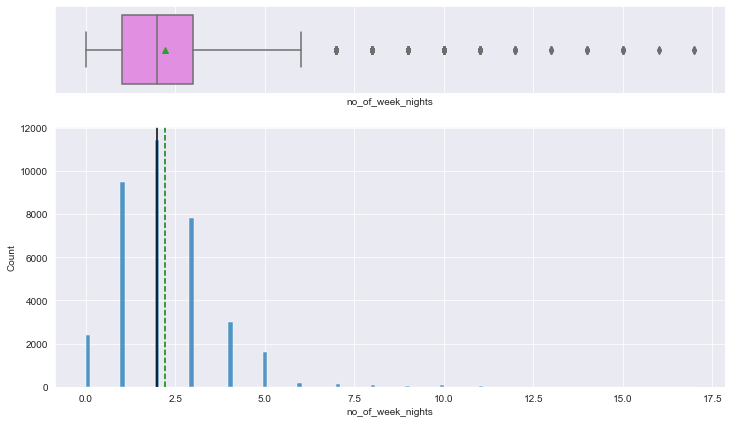

In [29]:
# Number of week nights for a booking histogram and boxplot
histogram_boxplot(df1, "no_of_week_nights")

### Observations for number of week nights
* The most frequent number of week nights for a booking is 2, which is 31.5% of the bookings.
* Second most frequent number of week nights for a booking is 1, which is 26.2% of the bookings.
* The mean is greater than the median, and the median is 2 nights.
* There are multiple outliers to the right of the boxplot.
* The data is imbalanced with most of the data for 2 week nights.

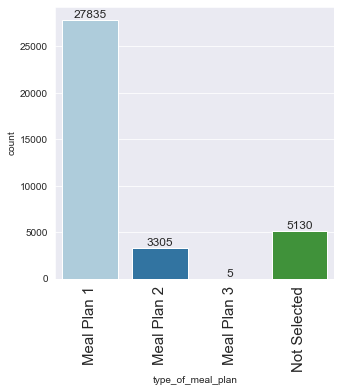

In [30]:
# Type of meal plan for a booking
labeled_barplot(df1, "type_of_meal_plan")

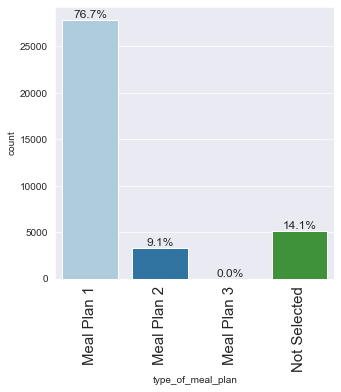

In [31]:
# Type of meal plan for a booking as a percentage
labeled_barplot(df1, "type_of_meal_plan", perc = True)

### Observations for meal plan
* The most common meal plan selection is Meal Plan 1 (Breakfast), which is 76.7% of the bookings.
* The second most common mean plan selection is Not Selected, which is 14.1% of the bookings. 
* The data is imbalanced with most of the data for Meal Plan 1.

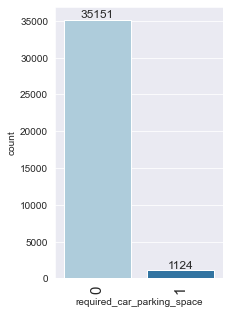

In [32]:
# Required number of parking spaces for a booking
labeled_barplot(df1, "required_car_parking_space")

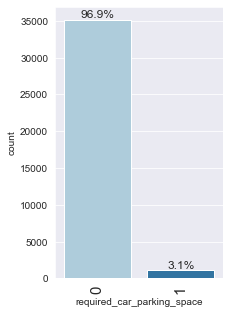

In [33]:
# Required number of parking spaces for a booking as a percentage
labeled_barplot(df1, "required_car_parking_space", perc = True)

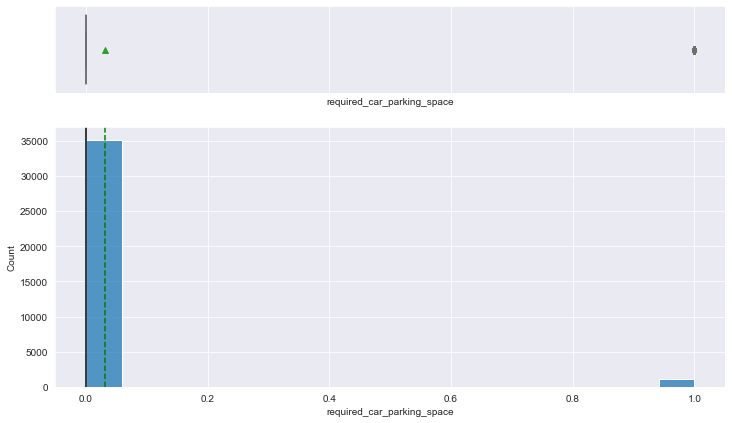

In [34]:
# Number of parking spaces for a booking histogram and boxplot
histogram_boxplot(df1, "required_car_parking_space")

### Observations for parking space
* The most frequent number of parking spaces for a booking is 0 (doesn't require a parking space), which is 96.9% of the bookings.
* Second most frequent number of parking spaces for a booking is 1 (does require a parking space), which is 3.1% of the bookings.
* The mean is greater than the median, and the median is 0 (doesn't require a parking space). 
* There is an outlier to the right of the median.
* The data is imbalanced with most of the data for 0 (doesn't require a parking space).

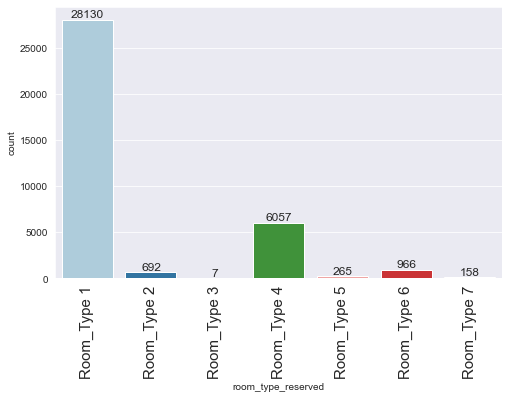

In [35]:
# Room type reserved for a booking
labeled_barplot(df1, "room_type_reserved")

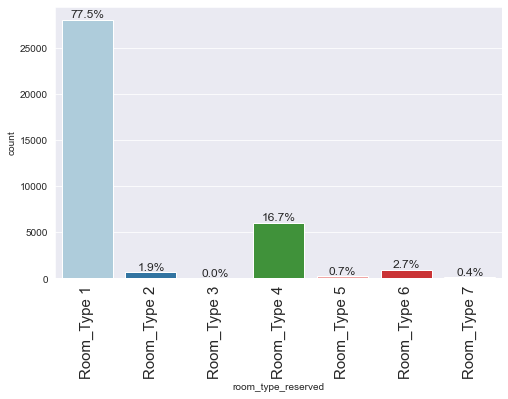

In [36]:
# Room type reserved for a booking as a percentage
labeled_barplot(df1, "room_type_reserved", perc = True)

### Observations for room type reserved
* The most frequent type of room reserved for a booking is Room Type 1, which is 77.5% of the bookings.
* Second most frequent type of room reserved for a booking is Room Type 4, which is 16.7% of the bookings.
* The data is imbalanced with most of the data for Room Type 1.

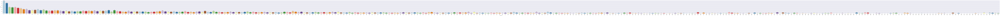

In [37]:
# Lead time (number of days between booking and arrival date) for a booking
labeled_barplot(df1, "lead_time")

In [38]:
# Since the values for each lead time is too many for a barplot, displaying value counts for each lead time
df1.lead_time.value_counts().sort_values(ascending=False)

0      1297
1      1078
2       643
3       630
4       628
       ... 
348       1
345       1
350       1
325       1
351       1
Name: lead_time, Length: 352, dtype: int64

In [39]:
# Since the values for each lead time is too many for a barplot, displaying value counts for each lead time as a percentage
df1.lead_time.value_counts(normalize = True).sort_values(ascending=False) * 100

0      3.575465
1      2.971744
2      1.772571
3      1.736733
4      1.731220
         ...   
348    0.002757
345    0.002757
350    0.002757
325    0.002757
351    0.002757
Name: lead_time, Length: 352, dtype: float64

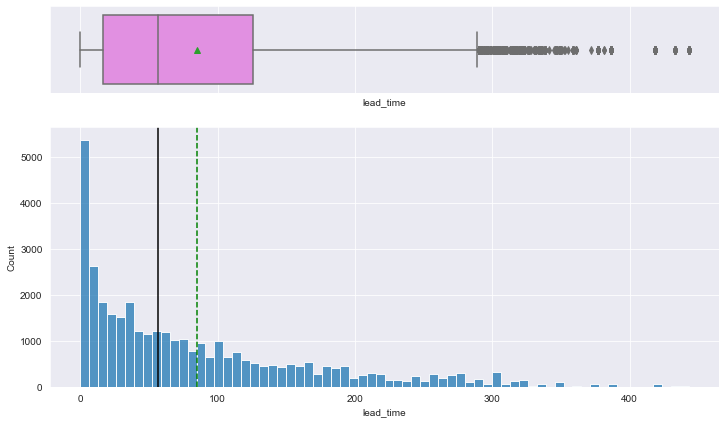

In [40]:
# Lead time histogram and boxplot
histogram_boxplot(df1, "lead_time")

### Observations for lead time
* The most frequent lead time for a booking is 0 days, which is 3.58% of the bookings.
* Second most frequent type of lead time for a booking is 1 day, which is 2.97% of the bookings.
* The mean is greater than the median, and the median is 57 days.
* There are multiple outliers to the right of the boxplot.

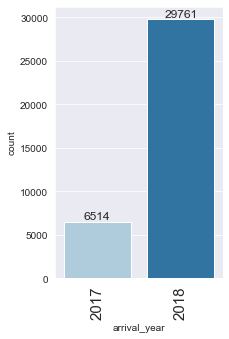

In [41]:
# Arrival Year for a booking
labeled_barplot(df1, "arrival_year")

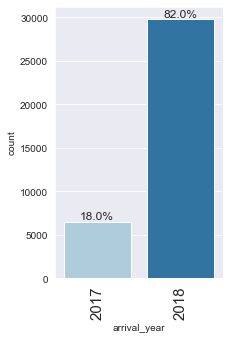

In [42]:
# Arrival Year for a booking as a percentage
labeled_barplot(df1, "arrival_year", perc = True)

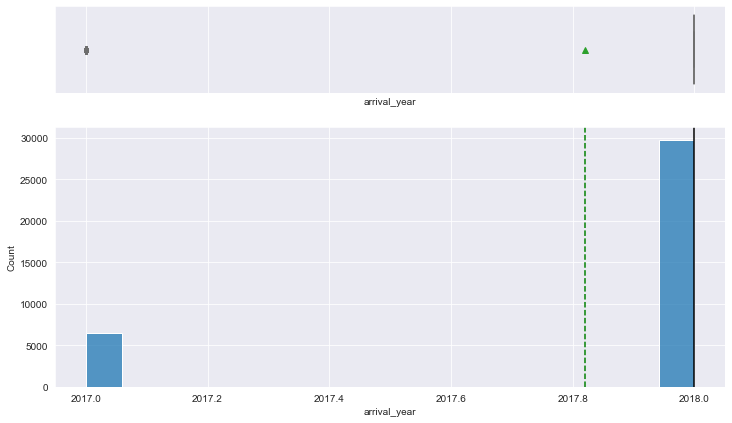

In [43]:
# Arrival Year for a booking histogram and boxplot
histogram_boxplot(df1, "arrival_year")

### Observations for arrival year
* The most frequent year for a booking is 2018, which is 82% of the bookings.
* Second most frequent year for a booking is 2017, which is 18% of the bookings.
* The mean is less than the median, and the median is 2018.
* There is an outlier to the left of the median.
* The data is imbalanced with most of the data for 2018.

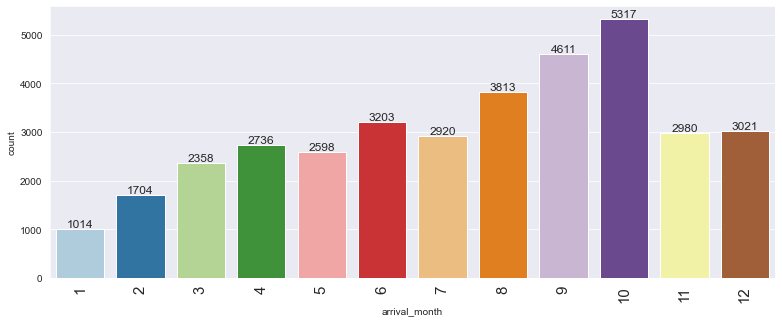

In [44]:
# Arrival month for a booking
labeled_barplot(df1, "arrival_month")

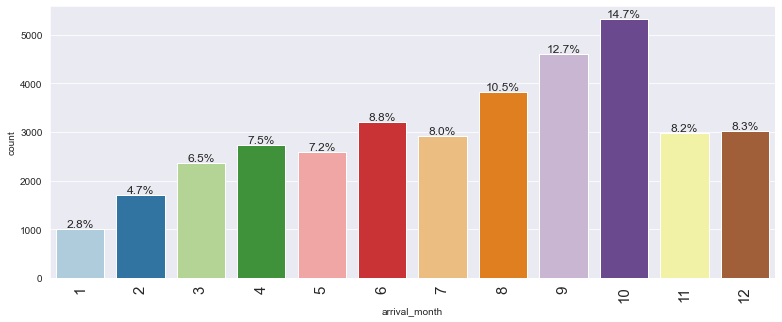

In [45]:
# Arrival month for a booking as a percentage
labeled_barplot(df1, "arrival_month", perc = True)

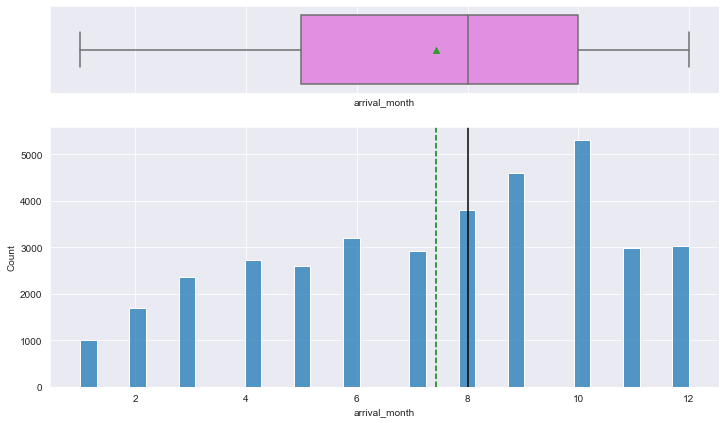

In [46]:
# Arrival month for a booking histogram and boxplot
histogram_boxplot(df1, "arrival_month")

### Observations for arrival month
* The most frequent arrival month for a booking is 10, which is 14.7% of the bookings.
* Second most frequent arrival month for a booking is 9, which is 12.7% of the bookings.
* The mean is less than the median, and the median is 8.
* There are no outliers in the boxplot.

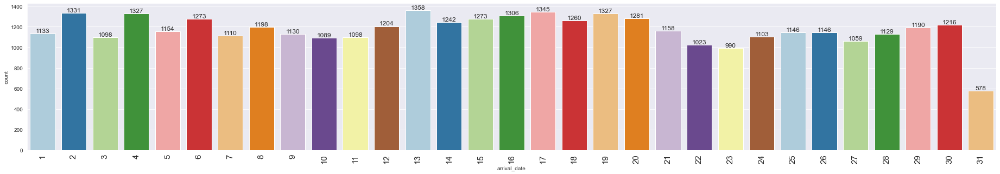

In [47]:
# Arrival date for a booking
labeled_barplot(df1, "arrival_date")

In [48]:
# Since the values for each arrival time is too many for a barplot, displaying value counts for each arrival time
df1.arrival_date.value_counts().sort_values(ascending=False)

13    1358
17    1345
2     1331
4     1327
19    1327
16    1306
20    1281
15    1273
6     1273
18    1260
14    1242
30    1216
12    1204
8     1198
29    1190
21    1158
5     1154
26    1146
25    1146
1     1133
9     1130
28    1129
7     1110
24    1103
11    1098
3     1098
10    1089
27    1059
22    1023
23     990
31     578
Name: arrival_date, dtype: int64

In [49]:
# Since the values for each arrival time is too many for a barplot, displaying value counts for each arrival time as a percentage
df1.arrival_date.value_counts(normalize = True).sort_values(ascending=False) * 100

13    3.743625
17    3.707788
2     3.669194
4     3.658167
19    3.658167
16    3.600276
20    3.531358
15    3.509304
6     3.509304
18    3.473467
14    3.423846
30    3.352171
12    3.319090
8     3.302550
29    3.280496
21    3.192281
5     3.181254
26    3.159201
25    3.159201
1     3.123363
9     3.115093
28    3.112336
7     3.059959
24    3.040662
11    3.026878
3     3.026878
10    3.002068
27    2.919366
22    2.820124
23    2.729152
31    1.593384
Name: arrival_date, dtype: float64

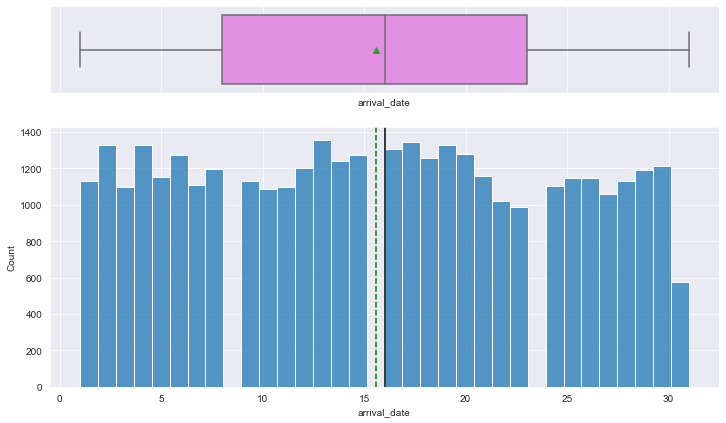

In [50]:
# Arrival date histogram and boxplot
histogram_boxplot(df1, "arrival_date")

### Observations for arrival date
* The most frequent arrival date for a booking is the 13th, which is 3.74% of the bookings.
* Second most frequent type arrival date for a booking is the 17th, which is 3.71% of the bookings.
* The mean is less than the median, and the median is the 16th.
* There are no outliers on the boxplot.

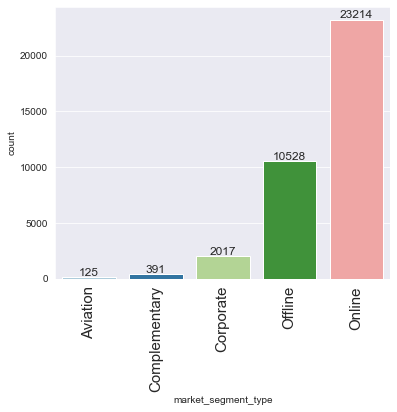

In [51]:
# Market segment type for a booking
labeled_barplot(df1, "market_segment_type")

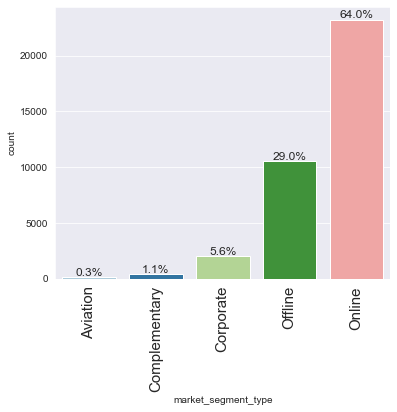

In [52]:
# Market segment type as a percentage for a booking
labeled_barplot(df1, "market_segment_type", perc = True)

### Observations for market segment
* The most common type of market segment is online, which is 64% of the bookings.
* Second most common type of market segment is offline, which is 29% of the bookings.
* The data is imbalanced with most of the data for Online.

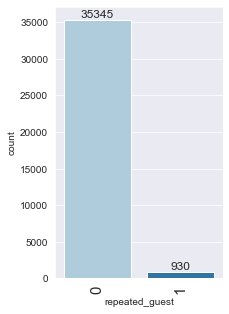

In [53]:
# Repeat guest for a booking
labeled_barplot(df1, "repeated_guest")

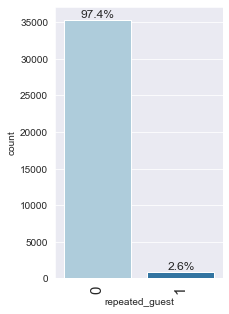

In [54]:
# Repeat guest for a booking as a percentage
labeled_barplot(df1, "repeated_guest", perc = True)

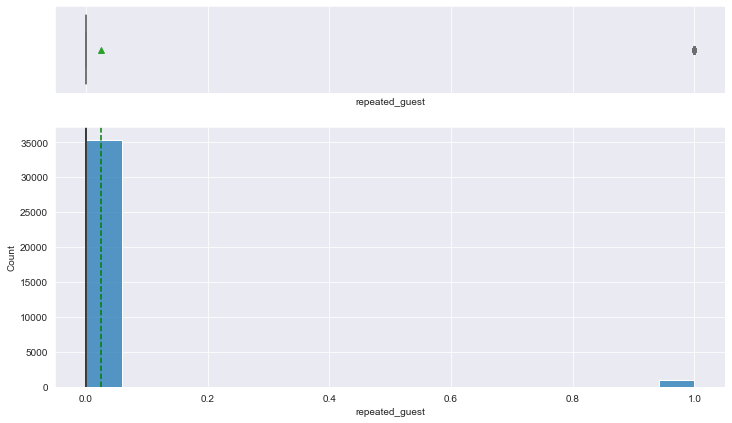

In [55]:
# Repeat guest for a booking histogram and boxplot
histogram_boxplot(df1, "repeated_guest")

### Observations for repeat guest
* The most frequent number for repeated guests is 0 (meaning not a repeat guest), which is 97.4% of the bookings.
* Second most frequent number for repeated guests is 1 (meaning a repeat guest), which is 2.6% of the bookings.
* The mean is greater than the median, and the median is 0.
* There is one outlier to the right of the median.
* The data is imbalanced with most of the data for 0, which means not a repeat guest.

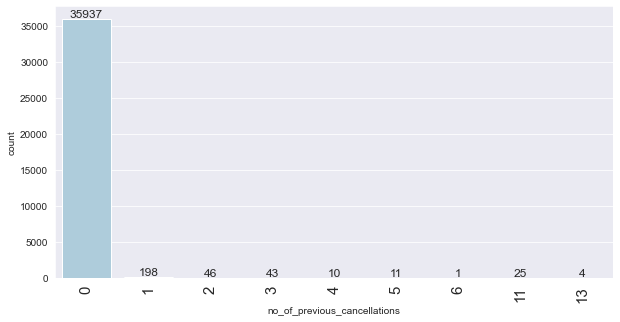

In [56]:
# Number of previous booking cancellations for a booking
labeled_barplot(df1, "no_of_previous_cancellations")

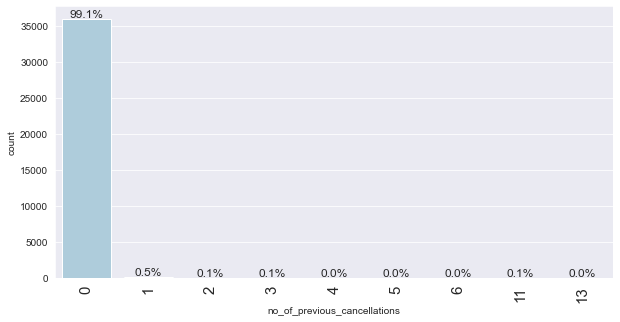

In [57]:
# Number of previous booking cancellations for a booking as a percentage
labeled_barplot(df1, "no_of_previous_cancellations", perc = True)

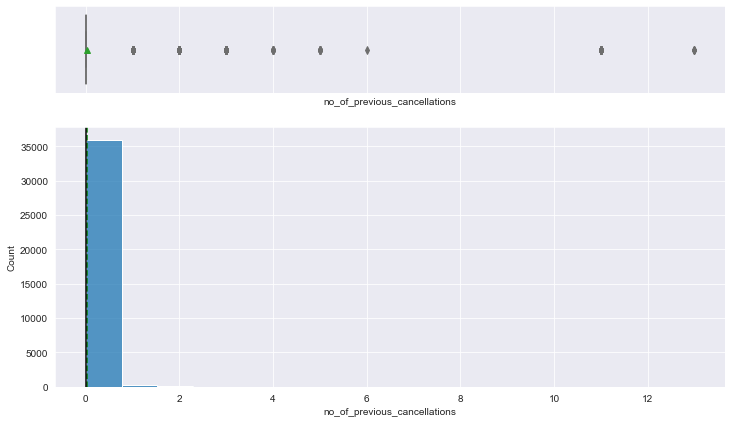

In [58]:
# Number of previous booking cancellations for a booking histogram and boxplot
histogram_boxplot(df1, "no_of_previous_cancellations")

### Observations for number of previous cancellations
* The most frequent number for number of previous cancellations is 0, which is 99.1% of the bookings.
* Second most frequent number for number of previous cancellations is 1, which is 0.5% of the bookings.
* The mean is a little greater than the median, and the median is 0. 
* The data is imbalanced with most of the data for 0 number of previous cancellations.

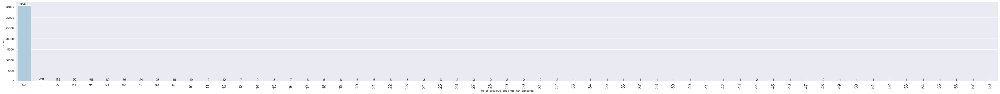

In [59]:
# Number of previous bookings not canceled for a booking
labeled_barplot(df1, "no_of_previous_bookings_not_canceled")

In [60]:
# Since the values for number of previous bookings not canceled is too many for a barplot, displaying value counts for each number of previous bookings not canceled
df1.no_of_previous_bookings_not_canceled.value_counts().sort_values(ascending=False)

0     35463
1       228
2       112
3        80
4        65
5        60
6        36
7        24
8        23
10       19
9        19
11       15
12       12
14        9
15        8
13        7
16        7
18        6
20        6
21        6
17        6
19        6
22        6
25        3
27        3
24        3
23        3
26        2
31        2
30        2
32        2
48        2
28        2
44        2
29        2
56        1
47        1
49        1
52        1
39        1
34        1
38        1
51        1
42        1
37        1
33        1
35        1
50        1
43        1
40        1
41        1
58        1
54        1
53        1
57        1
45        1
55        1
46        1
36        1
Name: no_of_previous_bookings_not_canceled, dtype: int64

In [61]:
# Since the values for number of previous bookings not canceled is too many for a barplot, displaying value counts for each number of previous bookings not canceled as a percentage
df1.no_of_previous_bookings_not_canceled.value_counts(normalize = True).sort_values(ascending=False) * 100

0     97.761544
1      0.628532
2      0.308753
3      0.220538
4      0.179187
5      0.165403
6      0.099242
7      0.066161
8      0.063405
10     0.052378
9      0.052378
11     0.041351
12     0.033081
14     0.024810
15     0.022054
13     0.019297
16     0.019297
18     0.016540
20     0.016540
21     0.016540
17     0.016540
19     0.016540
22     0.016540
25     0.008270
27     0.008270
24     0.008270
23     0.008270
26     0.005513
31     0.005513
30     0.005513
32     0.005513
48     0.005513
28     0.005513
44     0.005513
29     0.005513
56     0.002757
47     0.002757
49     0.002757
52     0.002757
39     0.002757
34     0.002757
38     0.002757
51     0.002757
42     0.002757
37     0.002757
33     0.002757
35     0.002757
50     0.002757
43     0.002757
40     0.002757
41     0.002757
58     0.002757
54     0.002757
53     0.002757
57     0.002757
45     0.002757
55     0.002757
46     0.002757
36     0.002757
Name: no_of_previous_bookings_not_canceled, dtype: float

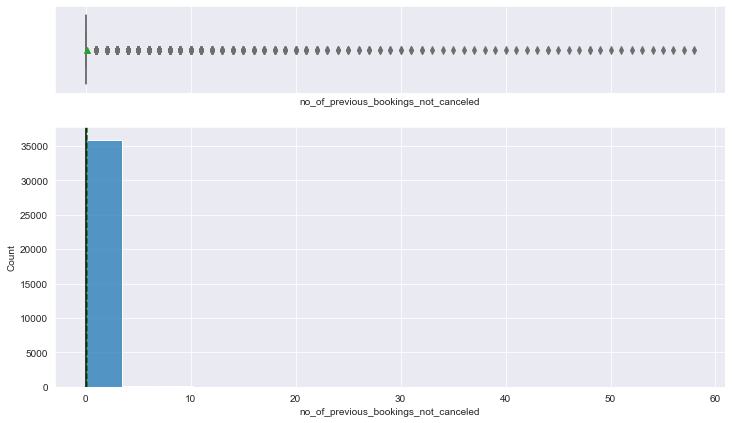

In [62]:
# Number of previous bookings not canceled for a booking histogram and boxplot
histogram_boxplot(df1, "no_of_previous_bookings_not_canceled")

### Observations for number of previous bookings not canceled
* The most frequent number for number of previous bookings not canceled is 0, which is 97.8% of the bookings.
* Second most frequent number for number of previous bookings not canceled is 1, which is 0.63% of the bookings.
* The mean is a little greater than the median, and the median is 0. 
* There are multiple outliers to the right of the median.
* The data is imbalanced with most of the data for 0 number of previous bookings not canceled.

In [63]:
# Average price of a room booking (in Euros)
# Since the values for average price for a room booking is too many for a barplot, displaying value counts for each average price for a room booking
df1.avg_price_per_room.value_counts().sort_values(ascending=False)

65.00     848
75.00     826
90.00     703
95.00     669
115.00    662
         ... 
103.86      1
129.83      1
246.60      1
86.85       1
167.80      1
Name: avg_price_per_room, Length: 3930, dtype: int64

In [64]:
# Since the values for average price for a room booking is too many for a barplot, displaying value counts for each average price for a room booking as a percentage
df1.avg_price_per_room.value_counts(normalize = True).sort_values(ascending=False) * 100

65.00     2.337698
75.00     2.277050
90.00     1.937974
95.00     1.844245
115.00    1.824948
            ...   
103.86    0.002757
129.83    0.002757
246.60    0.002757
86.85     0.002757
167.80    0.002757
Name: avg_price_per_room, Length: 3930, dtype: float64

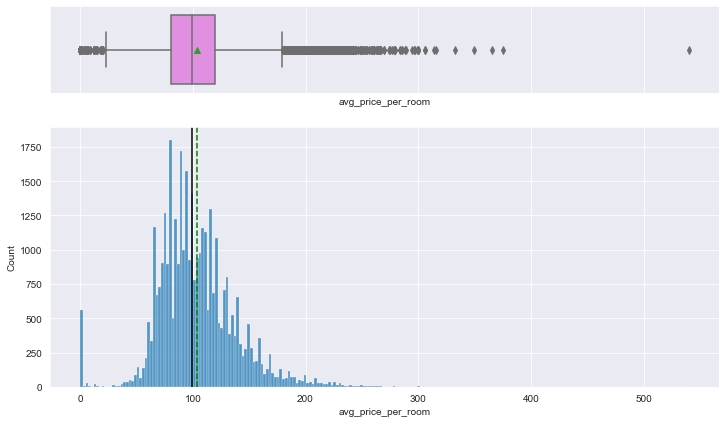

In [65]:
# Average price of a room booking boxplot and histogram
histogram_boxplot(df1, "avg_price_per_room")

### Observations for average price per room
* The most frequent average price per room is 65 Euros, which is 2.34% of the bookings.
* Second most frequent average price per room is 75 Euros, which is 2.28% of the bookings.
* The mean is greater than the median, and the median is 99.45 Euros.
* There are multiple outliers on both sides of the boxplot.

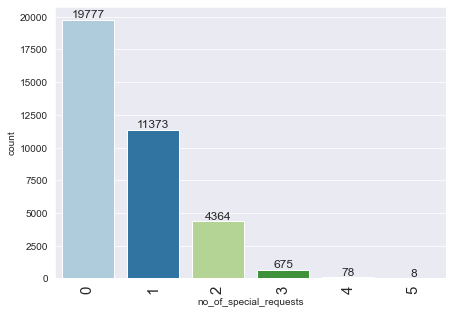

In [66]:
# Number of special requests per bookings
labeled_barplot(df1, "no_of_special_requests")

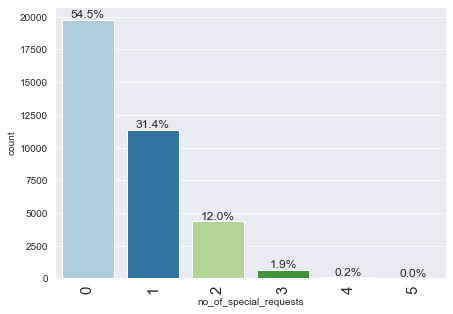

In [67]:
# Number of special requests per bookings as a percentage
labeled_barplot(df1, "no_of_special_requests", perc = True)

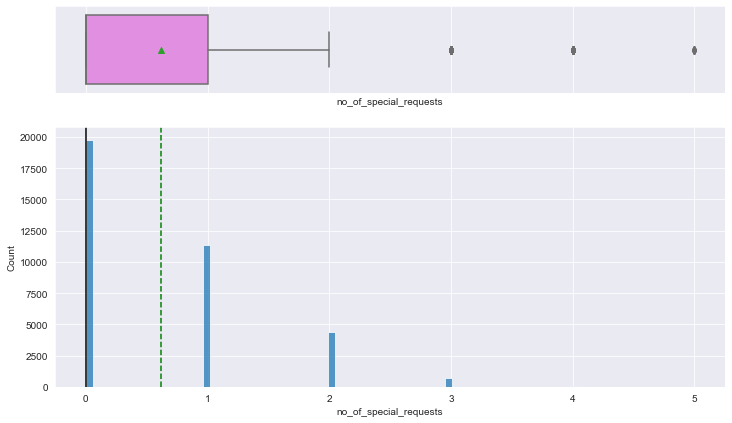

In [68]:
# Number of special requests per booking histogram and boxplot
histogram_boxplot(df1, "no_of_special_requests")

### Observations for number of special requests
* The most frequent number of special requests is 0, which is 54.5% of the bookings.
* Second most frequent number of special requests is 1, which is 31.4% of the bookings.
* The mean is greater than the median, and the median is 0.
* There are multiple outliers on the right side of the boxplot.
* The data is imbalanced with most of the data for 0 special requests.

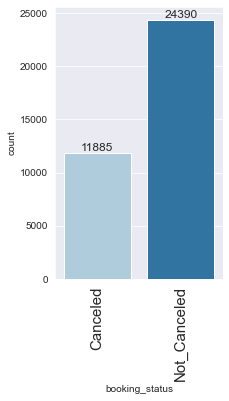

In [69]:
# Booking status per bookings
labeled_barplot(df1, "booking_status")

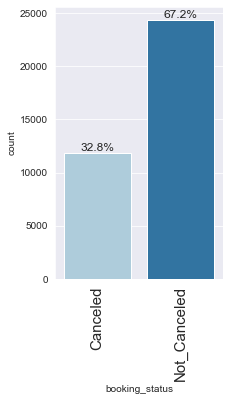

In [70]:
# Booking status per bookings as a percentage
labeled_barplot(df1, "booking_status", perc = True)

### Observations for booking status
* The most common booking status is Not Canceled, which is 67.2%.
* Second most common booking status is Canceled, which is 32.8%.

## Bivariate Analysis

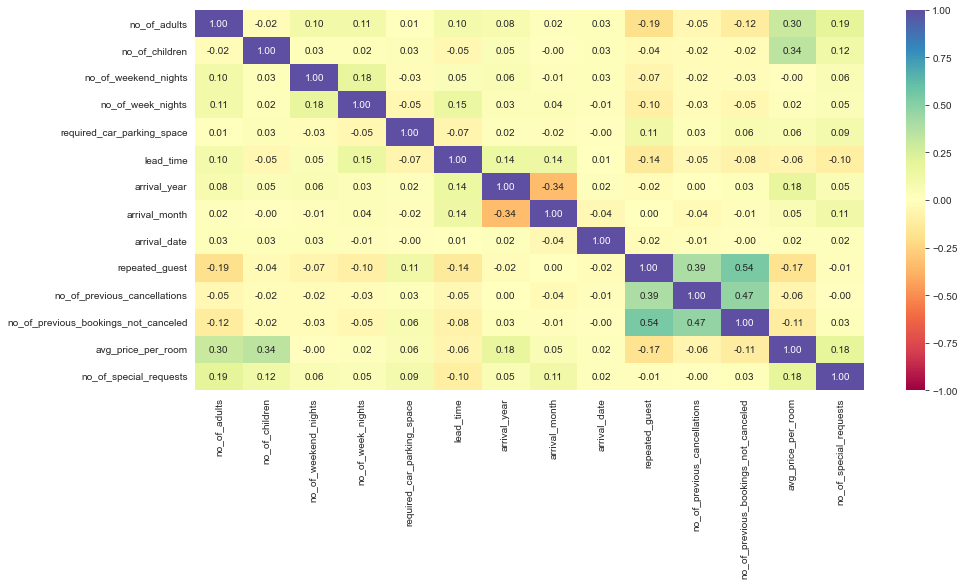

In [71]:
# Correlation heatmap for all numerical variables
plt.figure(figsize=(15, 7))
sns.heatmap(df1.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

### Observations for correlation heatmap
* Highest correlation seen is 0.54, which is between number of previous bookings not canceled and repeated guest. This makes some sense that there could be a relationship there as if a guest is a repeat visitor, chances are they probably won't be canceling their booking.
* Second highest correlation seen is 0.47, which is between number of previous cancellations and number of previous bookings not canceled. This also makes sense as both of these impact each other since they are opposite of each other.

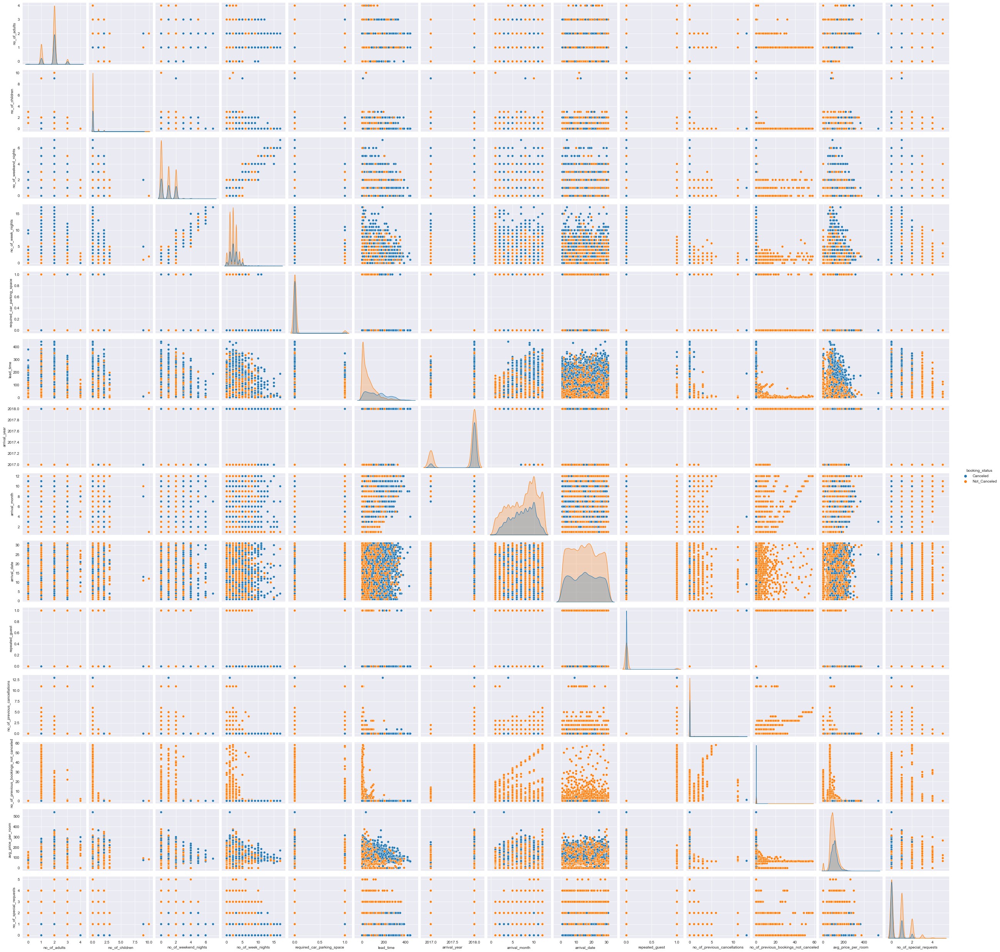

In [72]:
# Pairplots with hue as booking status (the target variable)
sns.pairplot(df1, hue = "booking_status")
plt.show()

In [73]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [74]:
### function to plot distributions wrt target

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

### Looking at relationships with target variable, "booking_status"

booking_status  Canceled  Not_Canceled    All
no_of_adults                                 
All                11885         24390  36275
2                   9119         16989  26108
1                   1856          5839   7695
3                    863          1454   2317
0                     44            95    139
4                      3            13     16
------------------------------------------------------------------------------------------------------------------------


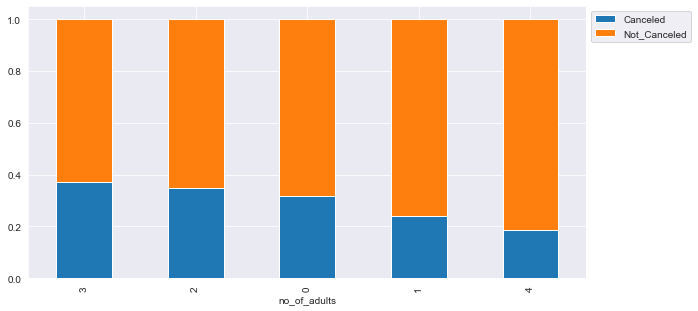

In [75]:
# Booking_status vs no_of_adults stacked barplot
stacked_barplot(df1, "no_of_adults", "booking_status")

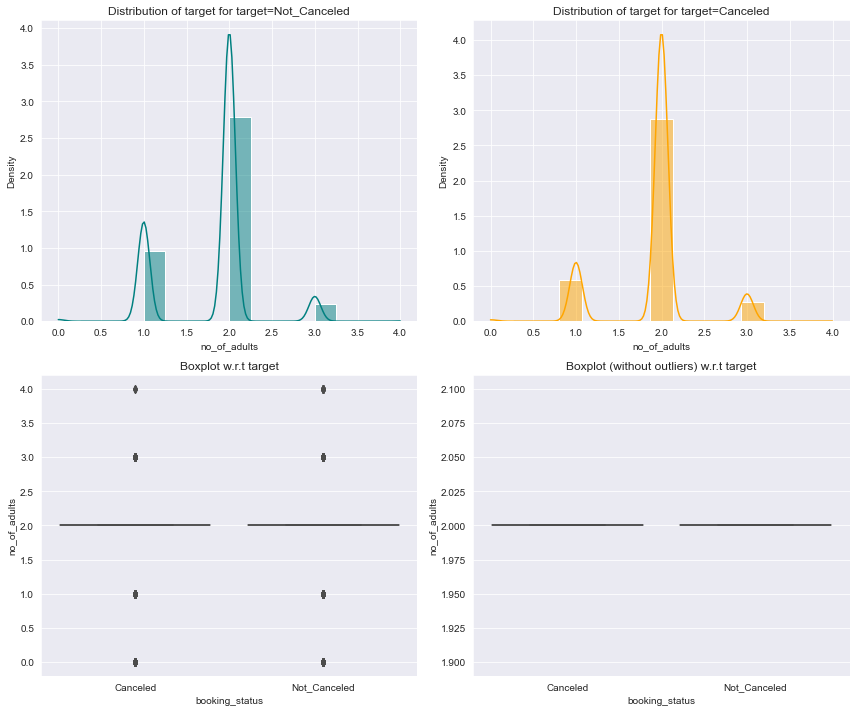

In [76]:
# Booking_status vs no_of_adults distribution plot
distribution_plot_wrt_target(df1, "no_of_adults", "booking_status")

### Observations for booking_status vs no_of_adults
* Bookings with 4 adults and 1 adult have the highest not canceled percentage compared to other bookings.
* Interesting to note, bookings that have 0 adults (most likely for kids) have a higher not canceled percentage compared to bookings for 2 or 3 adults. This might be because it might be harder to get bookings for just kids.
* Per the density plots, most of the data is for bookings with 1 or 2 adults by a wide margin.
* Per the boxplots, canceled and not canceled have the same medians, which is 0.

booking_status  Canceled  Not_Canceled    All
no_of_children                               
All                11885         24390  36275
0                  10882         22695  33577
1                    540          1078   1618
2                    457           601   1058
3                      5            14     19
9                      1             1      2
10                     0             1      1
------------------------------------------------------------------------------------------------------------------------


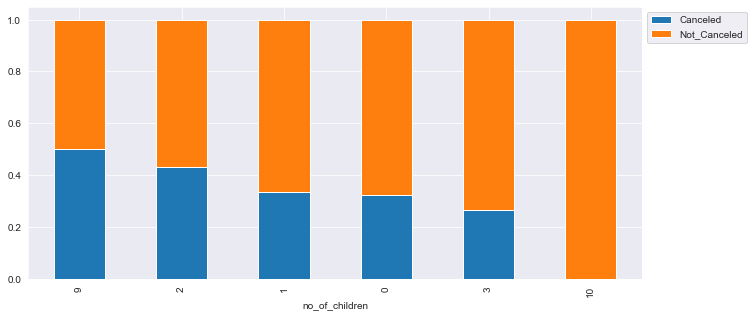

In [77]:
# Booking_status vs no_of_children stacked barplot
stacked_barplot(df1, "no_of_children", "booking_status")

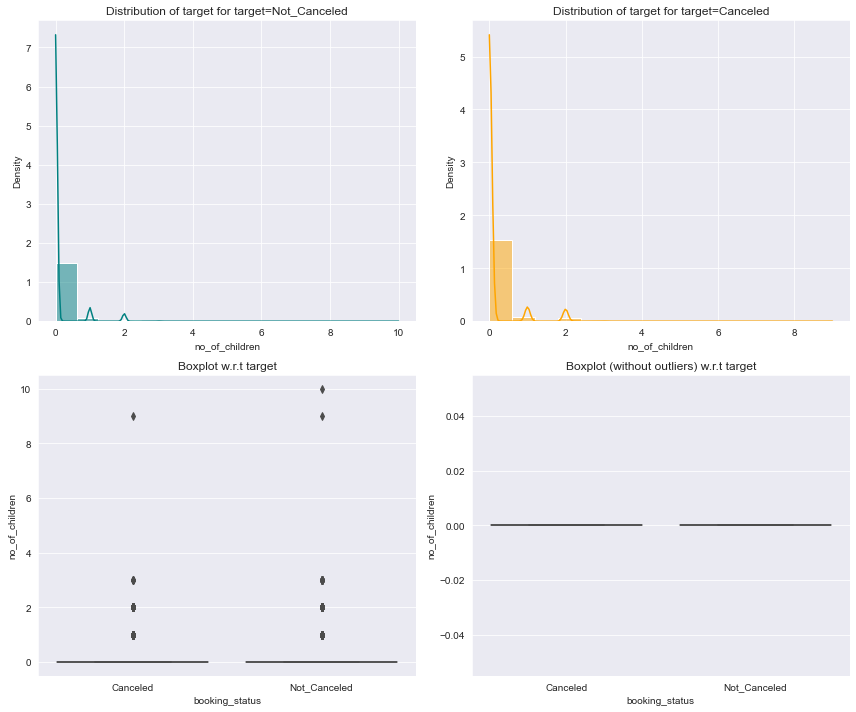

In [78]:
# Booking_status vs no_of_children distribution plot
distribution_plot_wrt_target(df1, "no_of_children", "booking_status")

### Observations for booking_status vs no_of_children
* Bookings with 10 children and 3 children have the highest not canceled percentage compared to other bookings.
* Bookings with 10 children have what looks to be 100% not canceled rate. However, this might be due to being very few of these bookings made.
* Interesting to note that bookings with 9 children don't have as high of a not canceled percentage (looks to be ~50%).
* Per the density plots, most of the data is for bookings with 0 children by a wide margin.
* Per the boxplots, canceled and not canceled have the same median, which is 0.

booking_status        Canceled  Not_Canceled    All
no_of_weekend_nights                               
All                      11885         24390  36275
0                         5093         11779  16872
1                         3432          6563   9995
2                         3157          5914   9071
4                           83            46    129
3                           74            79    153
5                           29             5     34
6                           16             4     20
7                            1             0      1
------------------------------------------------------------------------------------------------------------------------


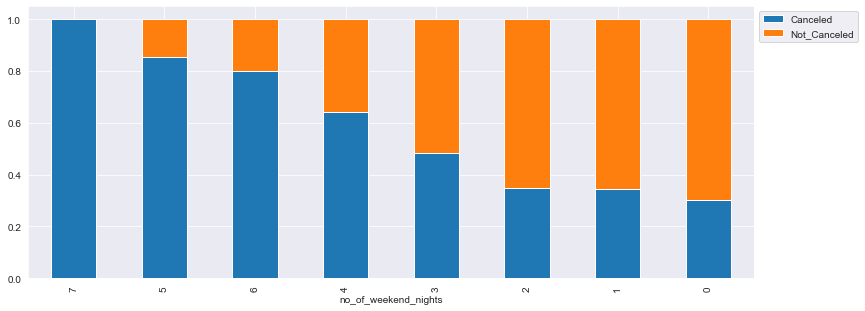

In [79]:
# Booking_status vs no_of_weekend_nights stacked barplot
stacked_barplot(df1, "no_of_weekend_nights", "booking_status")

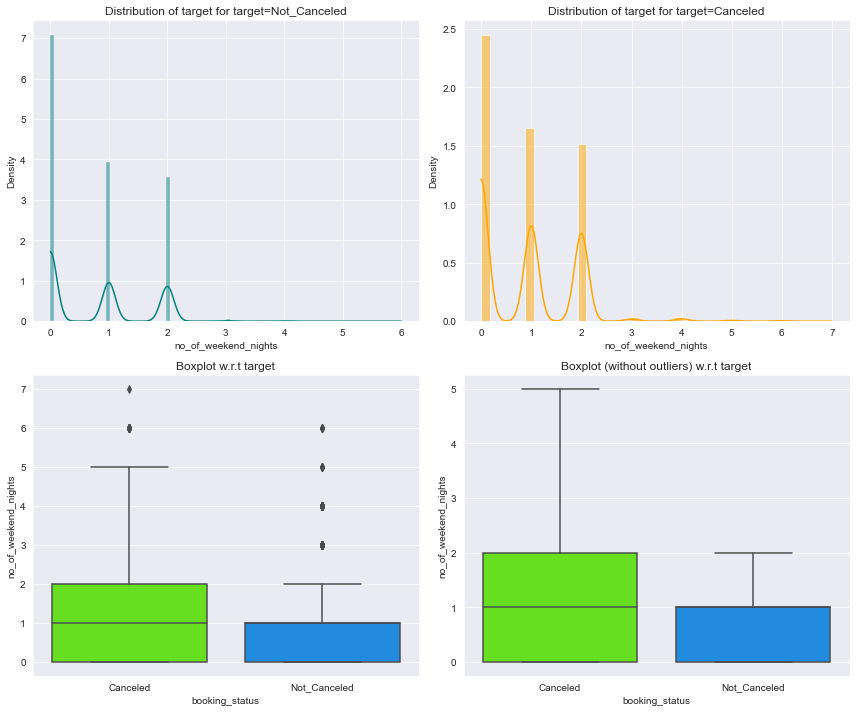

In [80]:
# Booking_status vs no_of_weekend_nights distribution plot
distribution_plot_wrt_target(df1, "no_of_weekend_nights", "booking_status")

### Observations for booking_status vs no_of_weekend_nights
* Bookings for 0, 1, and 2 weekend nights have the highest not canceled percentage compared to other bookings.
* Bookings for 0 weekend nights have a ~75% not canceled rate.
* Bookings with 3 or more weekend nights have 50% or higher canceled rate.
* Per the density plots, most of the data is for 0, 1, and 2 weekend nights by a wide margin.
* Per the boxplots, canceled has an InterQuartile Range (IQR) that looks to be two times the range of not canceled.

booking_status     Canceled  Not_Canceled    All
no_of_week_nights                               
All                   11885         24390  36275
2                      3997          7447  11444
3                      2574          5265   7839
1                      2572          6916   9488
4                      1143          1847   2990
0                       679          1708   2387
5                       632           982   1614
6                        88           101    189
10                       53             9     62
7                        52            61    113
8                        32            30     62
9                        21            13     34
11                       14             3     17
15                        8             2     10
12                        7             2      9
13                        5             0      5
14                        4             3      7
16                        2             0      2
17                  

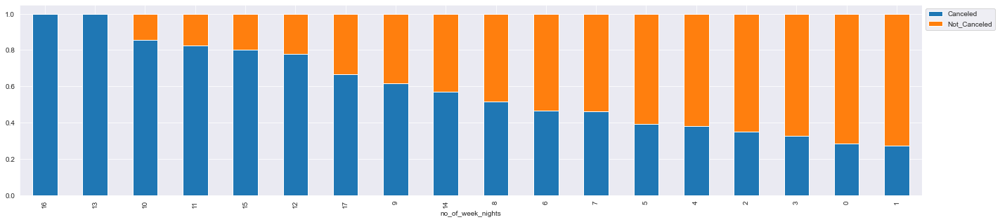

In [81]:
# Booking_status vs no_of_week_nights stacked barplot
stacked_barplot(df1, "no_of_week_nights", "booking_status")

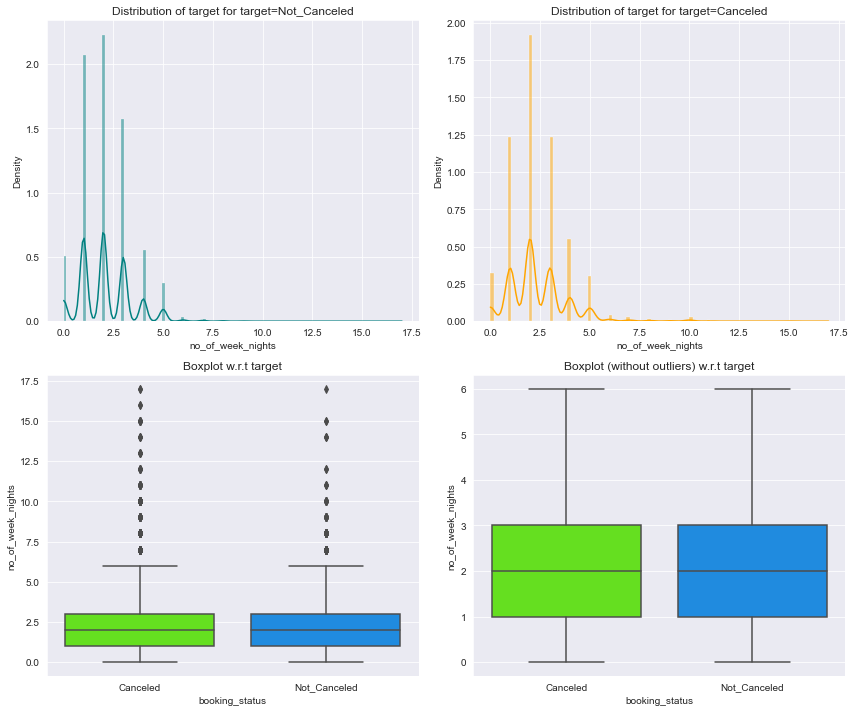

In [82]:
# Booking_status vs no_of_week_nights distribution plot
distribution_plot_wrt_target(df1, "no_of_week_nights", "booking_status")

### Observations for booking_status vs no_of_week_nights
* Bookings for 1, 0, and 3 week nights have the highest not canceled percentage compared to other bookings.
* Bookings with 8 or more week nights have 50% or higher canceled rate.
* Per the density plots, most of the data looks to be for 1, 2, and 3 week nights by a wide margin.
* Per the boxplots, canceled hand not canceled have identical IQRs.

booking_status     Canceled  Not_Canceled    All
type_of_meal_plan                               
All                   11885         24390  36275
Meal Plan 1            8679         19156  27835
Not Selected           1699          3431   5130
Meal Plan 2            1506          1799   3305
Meal Plan 3               1             4      5
------------------------------------------------------------------------------------------------------------------------


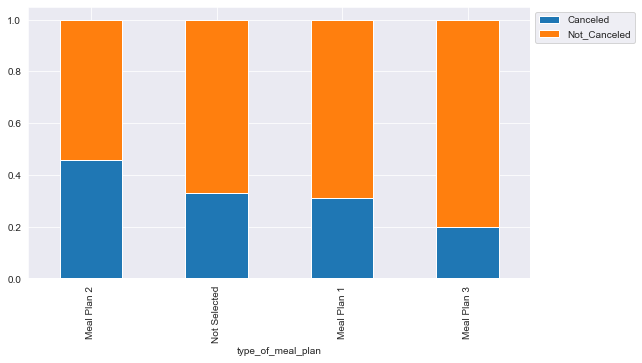

In [83]:
# Booking_status vs type_of_meal_plan stacked barplot
stacked_barplot(df1, "type_of_meal_plan", "booking_status")

<AxesSubplot:xlabel='type_of_meal_plan', ylabel='Count'>

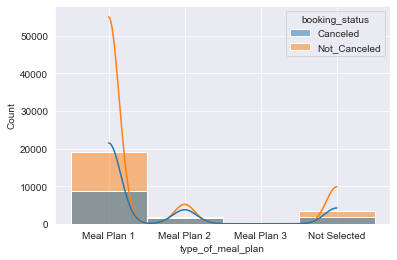

In [84]:
# Booking_status vs type_of_meal_plan distribution plot
sns.histplot(df1, x = "type_of_meal_plan", hue = "booking_status", kde = True)

### Observations for booking_status vs type_of_meal_plan
* Visitors that selected Meal Plan 3 (Full board - breakfast, lunch, and dinner) had the highest not canceled percentage compared to the other meal plans selected.
* Meal Plan 1 and Not Selected percentages for not canceled look very similar.
* Per the density plot, most of the data is for Meal Plan 1 (Breakfast) by a wide margin.

booking_status              Canceled  Not_Canceled    All
required_car_parking_space                               
All                            11885         24390  36275
0                              11771         23380  35151
1                                114          1010   1124
------------------------------------------------------------------------------------------------------------------------


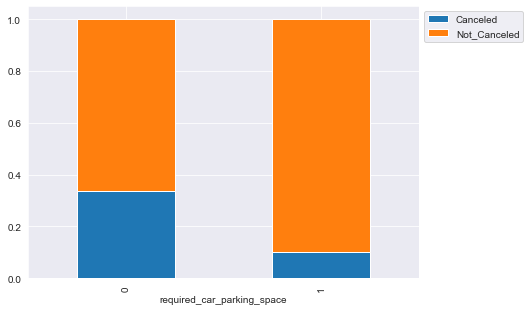

In [85]:
# Booking_status vs required_car_parking_space stacked barplot
stacked_barplot(df1, "required_car_parking_space", "booking_status")

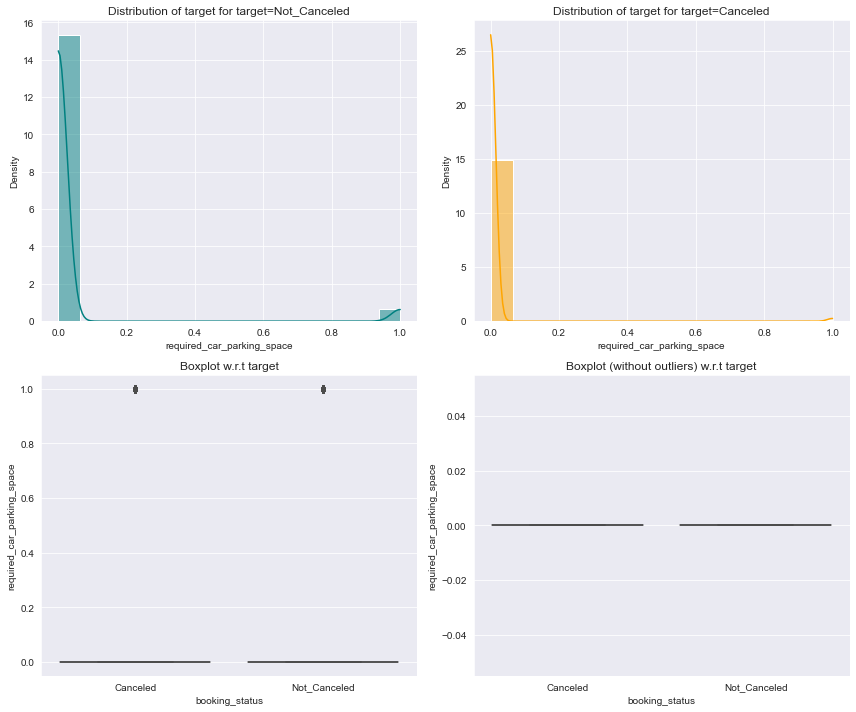

In [86]:
# Booking_status vs required_car_parking_space distribution plot
distribution_plot_wrt_target(df1, "required_car_parking_space", "booking_status")

### Observations for booking_status vs required_car_parking_space
* Visitors that selected required a parking space had the highest not canceled percentage (~90%) compared to those that don't need a parking space.
* Per the density plots, most of the data is for 0 (visitors not needing a parking space) by a wide margin.
* Per the boxplots, canceled and not canceled have the same median, which is 0.

booking_status      Canceled  Not_Canceled    All
room_type_reserved                               
All                    11885         24390  36275
Room_Type 1             9072         19058  28130
Room_Type 4             2069          3988   6057
Room_Type 6              406           560    966
Room_Type 2              228           464    692
Room_Type 5               72           193    265
Room_Type 7               36           122    158
Room_Type 3                2             5      7
------------------------------------------------------------------------------------------------------------------------


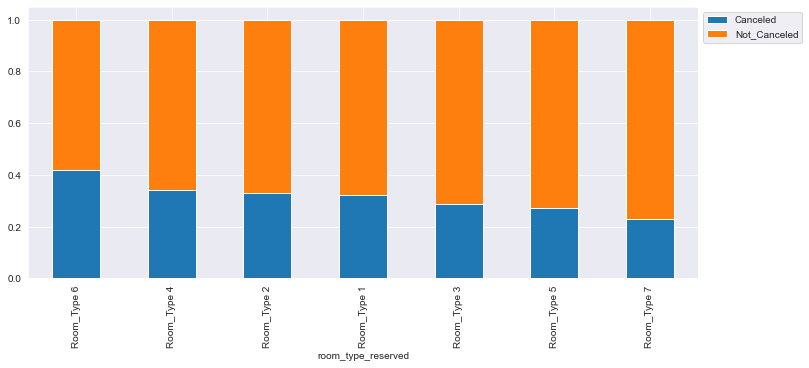

In [87]:
# Booking_status vs room_type_reserved stacked barplot
stacked_barplot(df1, "room_type_reserved", "booking_status")

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

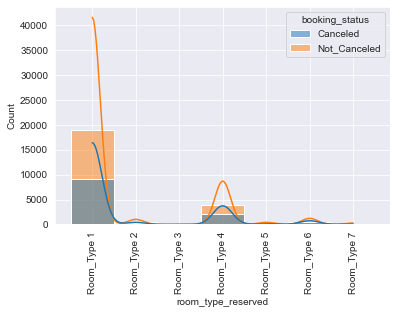

In [88]:
# Booking_status vs room_type_reserved distribution plot
sns.histplot(df1, x = "room_type_reserved", hue = "booking_status", kde = True)
plt.xticks(rotation = 90)

### Observations for booking_status vs room_type_reserved
* Visitors that selected Room Type 7 had the highest not canceled percentage compared to the other rooms selected.
* Per the density plot, most of the data by a wide margin is for Room Type 1 followed by Room Type 4.

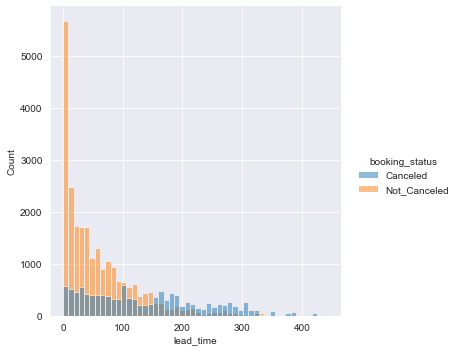

In [89]:
# Booking_status vs lead_time stacked displot
sns.displot(df1, x = "lead_time", hue = "booking_status", bins = 50)

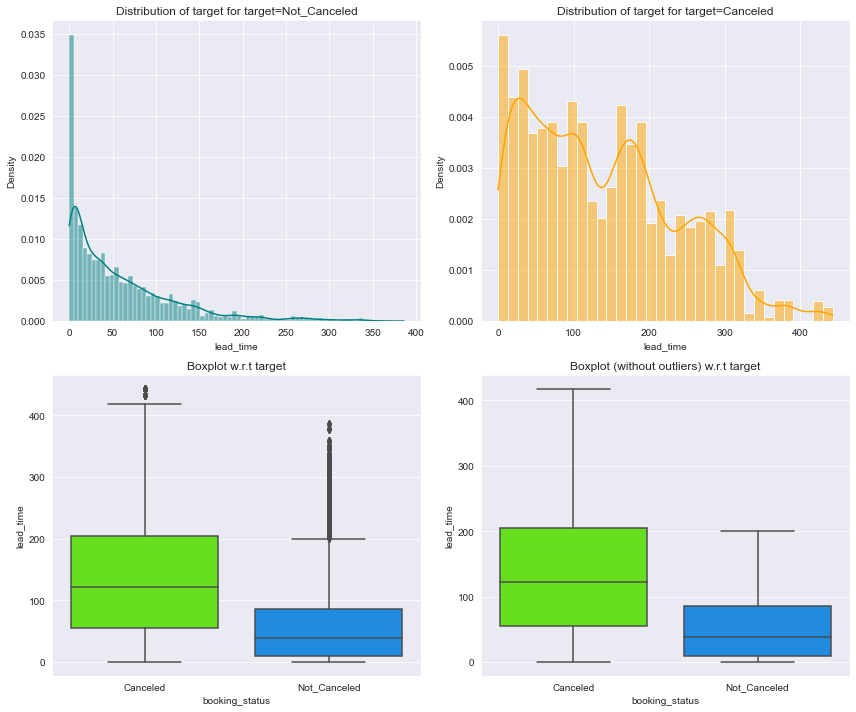

In [90]:
# Booking_status vs lead_time distribution plot
distribution_plot_wrt_target(df1, "lead_time", "booking_status")

### Observations for booking_status vs lead_time
* Visitors that booked a room with a lead time of 0 days had the highest not canceled rate, which makes sense since most hotels have a policy that if a booking is canceled in under 24 hours, it has to be paid in full.
* Per the density plots, most of the data is for 0 days lead time.
* Per the boxplots, canceled has a much larger IQR than not canceled.

booking_status  Canceled  Not_Canceled    All
arrival_year                                 
All                11885         24390  36275
2018               10924         18837  29761
2017                 961          5553   6514
------------------------------------------------------------------------------------------------------------------------


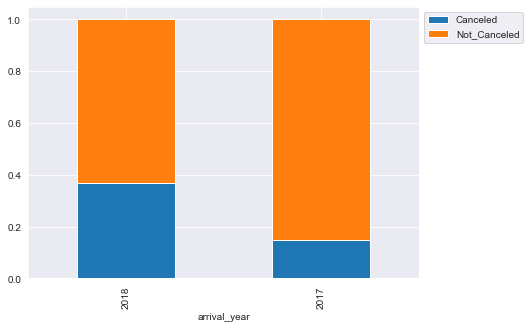

In [91]:
# Booking_status vs arrival_year stacked barplot
stacked_barplot(df1, "arrival_year", "booking_status")

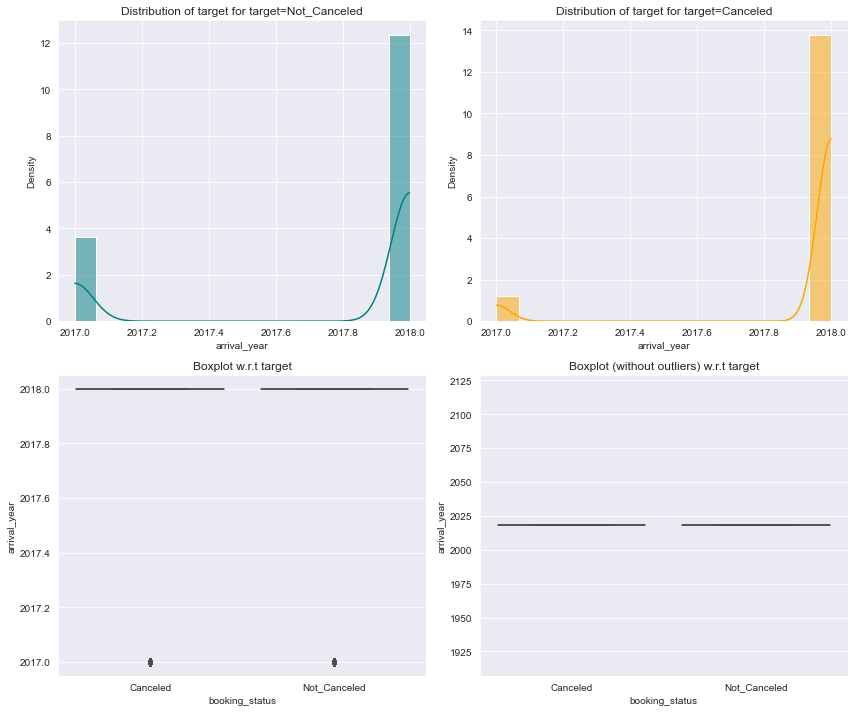

In [92]:
# Booking_status vs arrival_year distribution plot
distribution_plot_wrt_target(df1, "arrival_year", "booking_status")

### Observations for booking_status vs arrival_year
* Visitors that stayed in 2017 had a higher not canceled rate than visitors that stayed in 2018.
* Per the density plots, most of the data is for year 2018 by a large margin.
* Per the boxplots, canceled and not canceled have the same medians, which is 2018.

booking_status  Canceled  Not_Canceled    All
arrival_month                                
All                11885         24390  36275
10                  1880          3437   5317
9                   1538          3073   4611
8                   1488          2325   3813
7                   1314          1606   2920
6                   1291          1912   3203
4                    995          1741   2736
5                    948          1650   2598
11                   875          2105   2980
3                    700          1658   2358
2                    430          1274   1704
12                   402          2619   3021
1                     24           990   1014
------------------------------------------------------------------------------------------------------------------------


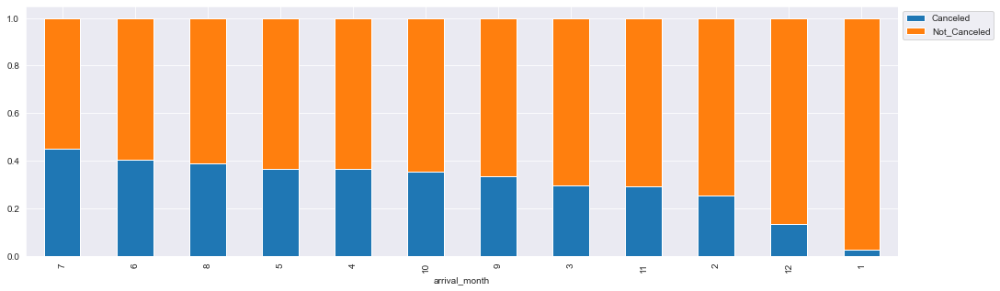

In [93]:
# Booking_status vs arrival_month stacked barplot
stacked_barplot(df1, "arrival_month", "booking_status")

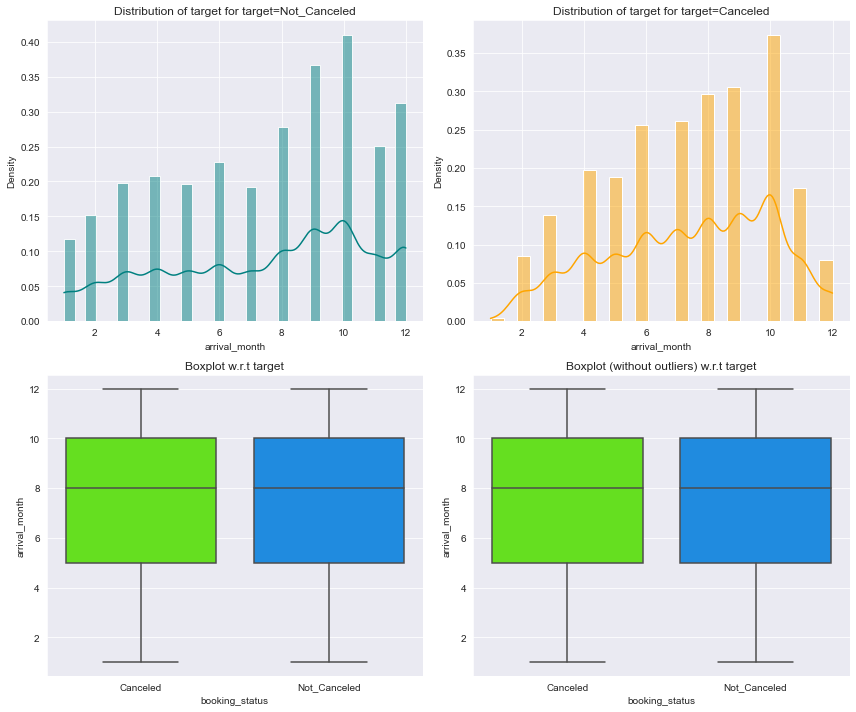

In [94]:
# Booking_status vs arrival_month distribution plot
distribution_plot_wrt_target(df1, "arrival_month", "booking_status")

### Observations for booking_status vs arrival_month
* Visitors that stayed in 1 (January) had the highest not canceled rate followed by 12 (December).
* Per the density plots, most of the data is for 10 (October), 9 (September), and 8 (August).
* Per the boxplots, canceled and not canceled have the same IQRs.

booking_status  Canceled  Not_Canceled    All
arrival_date                                 
All                11885         24390  36275
15                   538           735   1273
4                    474           853   1327
16                   473           833   1306
30                   465           751   1216
1                    465           668   1133
12                   460           744   1204
17                   448           897   1345
6                    444           829   1273
26                   425           721   1146
19                   413           914   1327
20                   413           868   1281
13                   408           950   1358
28                   405           724   1129
3                    403           695   1098
25                   395           751   1146
21                   376           782   1158
24                   372           731   1103
18                   366           894   1260
7                    364          

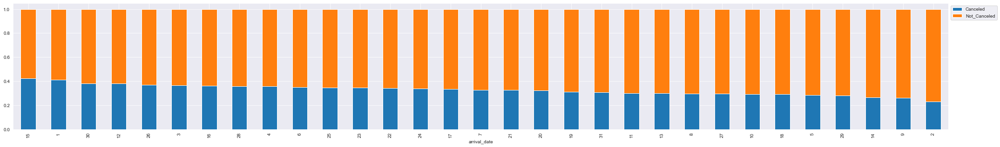

In [95]:
# Booking_status vs arrival_date stacked barplot
stacked_barplot(df1, "arrival_date", "booking_status")

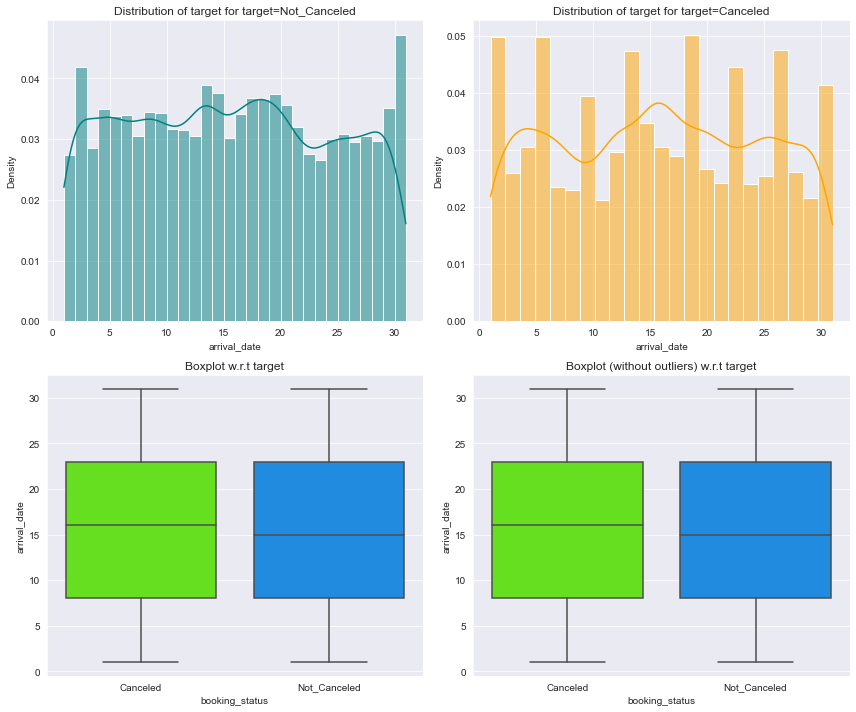

In [96]:
# Booking_status vs arrival_date distribution plot
distribution_plot_wrt_target(df1, "arrival_date", "booking_status")

### Observations for booking_status vs arrival_date
* Visitors that arrived on the 2nd day of the month had the highest not canceled rate.
* Per the density plots, most of the data looks to be between the 10th and 20th days of a month.
* Per the boxplots, canceled and not canceled have the same IQRs.

booking_status       Canceled  Not_Canceled    All
market_segment_type                               
All                     11885         24390  36275
Online                   8475         14739  23214
Offline                  3153          7375  10528
Corporate                 220          1797   2017
Aviation                   37            88    125
Complementary               0           391    391
------------------------------------------------------------------------------------------------------------------------


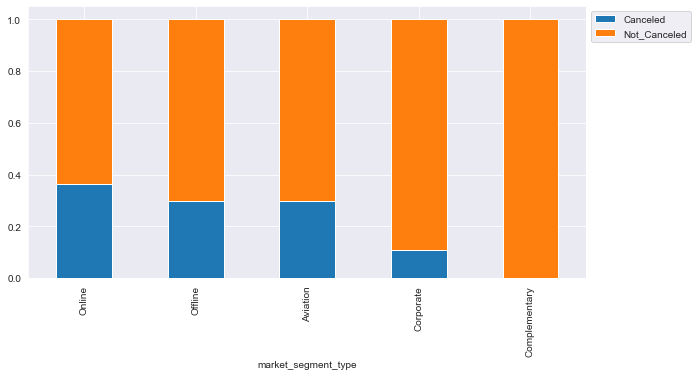

In [97]:
# Booking_status vs market_segment_type stacked barplot
stacked_barplot(df1, "market_segment_type", "booking_status")

<AxesSubplot:xlabel='market_segment_type', ylabel='Count'>

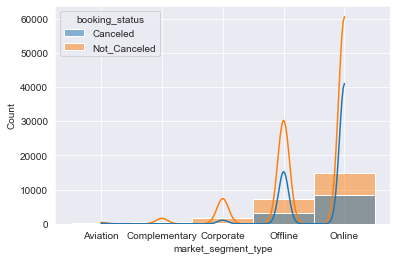

In [98]:
# Booking_status vs market_segment_type distribution plot
sns.histplot(df1, x = "market_segment_type", hue = "booking_status", kde = True)

### Observations for booking_status vs market_segment_type
* Visitors that received a complimentary room had the highest non canceled rate, which makes sense since they didn't pay for their room.
* Per the density plot, most of the data is for online bookings, followed by offline, and corporate.

booking_status  Canceled  Not_Canceled    All
repeated_guest                               
All                11885         24390  36275
0                  11869         23476  35345
1                     16           914    930
------------------------------------------------------------------------------------------------------------------------


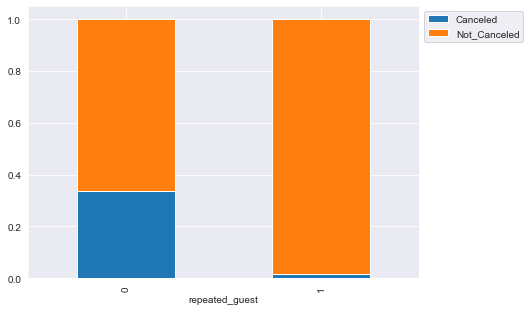

In [99]:
# Booking_status vs repeated_guest stacked barplot
stacked_barplot(df1, "repeated_guest", "booking_status")

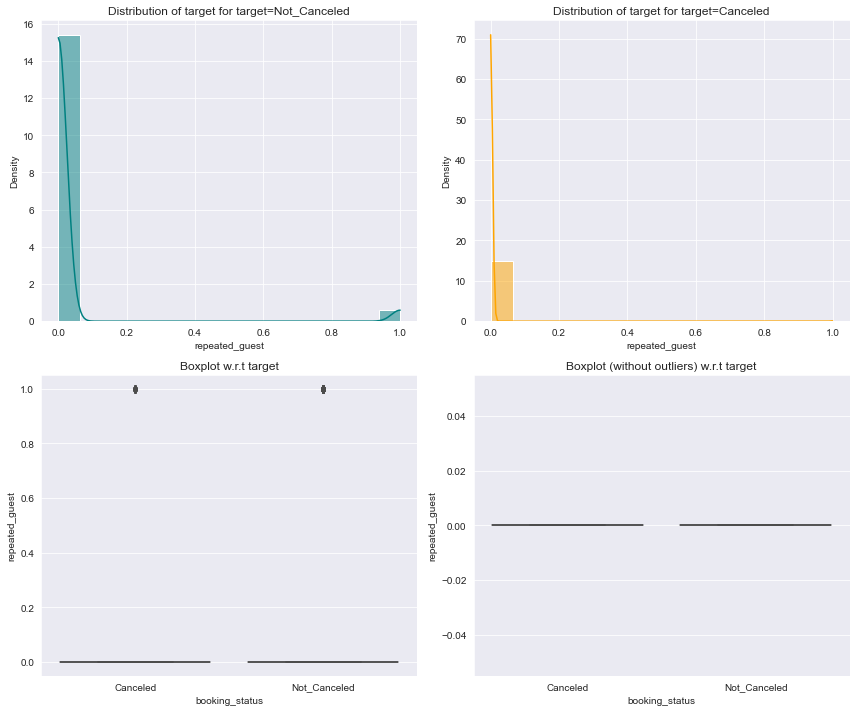

In [100]:
# Booking_status vs repeated_guest distribution plot
distribution_plot_wrt_target(df1, "repeated_guest", "booking_status")

### Observations for booking_status vs repeated_guest
* If a guest was a repeat visitor, they had the highest not canceled rate compared to a first time visitor, indicating that they had a good experience from their previous stay(s) that they would stay again.
* Per the density plots, most of the data is 0 (not a repeat guest) by a wide margin.
* Per the boxplots, canceled and not canceled have the same medians, which is 0.

booking_status                Canceled  Not_Canceled    All
no_of_previous_cancellations                               
All                              11885         24390  36275
0                                11869         24068  35937
1                                   11           187    198
13                                   4             0      4
3                                    1            42     43
2                                    0            46     46
4                                    0            10     10
5                                    0            11     11
6                                    0             1      1
11                                   0            25     25
------------------------------------------------------------------------------------------------------------------------


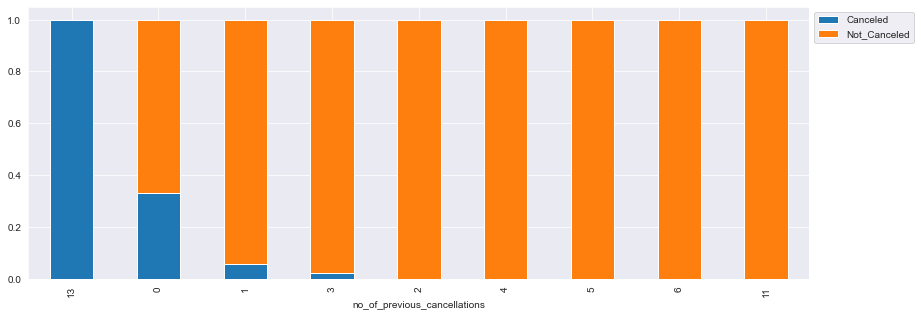

In [101]:
# Booking_status vs no_of_previous_cancellations stacked barplot
stacked_barplot(df1, "no_of_previous_cancellations", "booking_status")

<AxesSubplot:xlabel='no_of_previous_cancellations', ylabel='Count'>

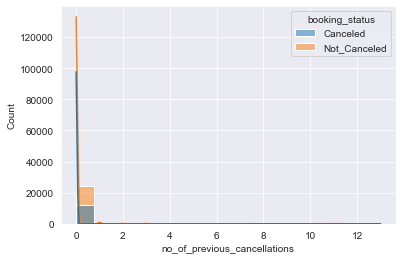

In [102]:
# Booking_status vs no_of_previous_cancellations stacked barplot
sns.histplot(df1, x = "no_of_previous_cancellations", hue = "booking_status", kde = True)

### Observations for booking_status vs no_of_previous_cancellations
* Interesting to note is that guests that canceled a booking 2, 4, 5, 6, or 11 times before all have a 100% booking rate for rate when they booked again.
* Guests that cancelled a booking  13 times before have a 100% rate of canceling. However, this might be due to very little data for guests that have canceled 13 times before.
* However, looking at the density plot, most of the data is 0 for 0 previous booking cancellations by a wide margin, suggesting that the previous booking cancellations of 2, 4, 5, 6 or 11 times are for very small numbers.

booking_status                        Canceled  Not_Canceled    All
no_of_previous_bookings_not_canceled                               
All                                      11885         24390  36275
0                                        11878         23585  35463
1                                            4           224    228
12                                           1            11     12
4                                            1            64     65
6                                            1            35     36
2                                            0           112    112
44                                           0             2      2
43                                           0             1      1
42                                           0             1      1
41                                           0             1      1
40                                           0             1      1
38                                           0  

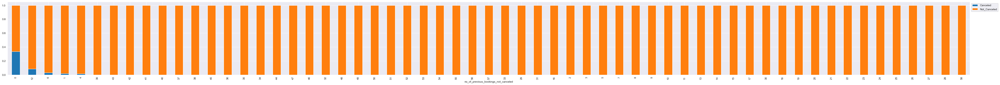

In [103]:
# Booking_status vs no_of_previous_bookings_not_canceled stacked barplot
stacked_barplot(df1, "no_of_previous_bookings_not_canceled", "booking_status")

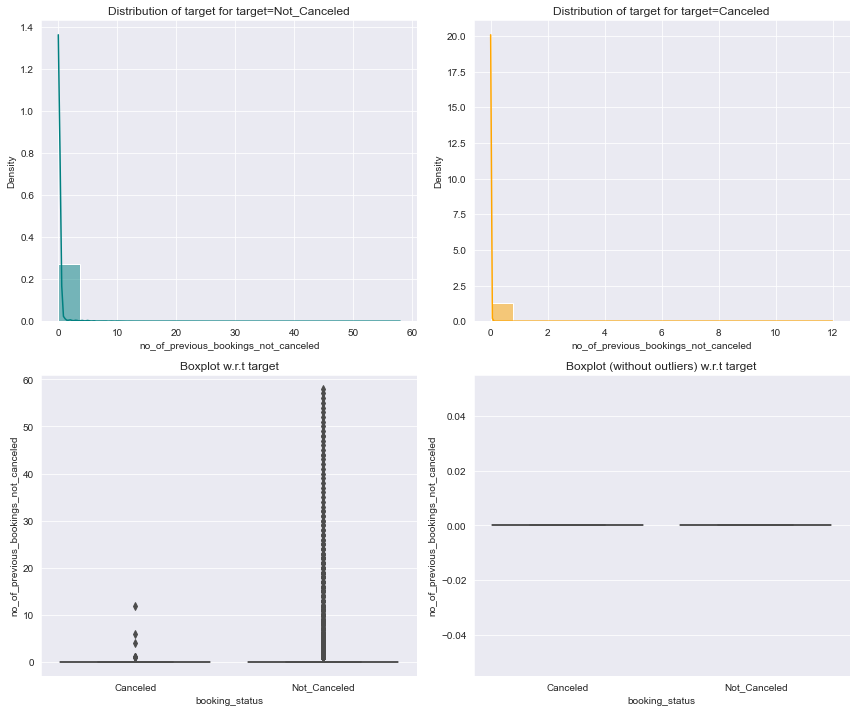

In [104]:
# Booking_status vs no_of_previous_bookings_not_canceled distribution plot
distribution_plot_wrt_target(df1, "no_of_previous_bookings_not_canceled", "booking_status")

### Observations for booking_status vs no_of_previous_bookings_not_canceled
* Interesting to note for almost every person that has booked 2 or more times, the not canceled booking percentage is 100% except for 4, 6, 12.
* Looking at the density plots, most of the data is 0 for 0 previous bookings not canceled by a wide margin.
* Per the boxplots, canceled and not canceled have the same medians, which is 0.

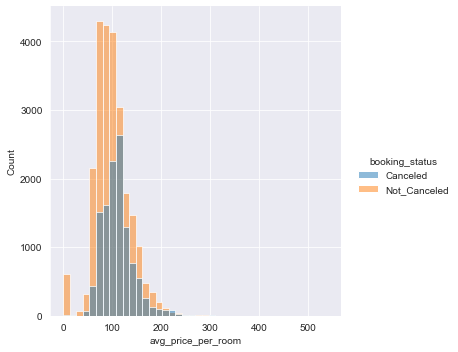

In [105]:
# Booking_status vs avg_price_per_room stacked displot
sns.displot(df1, x = "avg_price_per_room", hue = "booking_status", bins = 40)

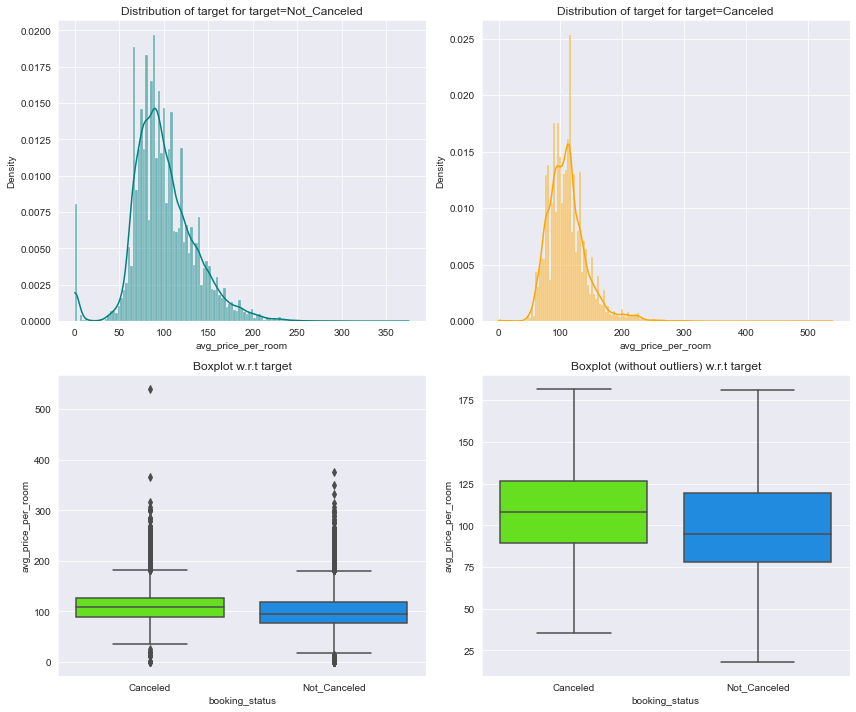

In [106]:
# Booking_status vs avg_price_per_room distribution plot
distribution_plot_wrt_target(df1, "avg_price_per_room", "booking_status")

### Observations for booking_status vs avg_price_per_room
* Looks to be rooms in the 80-100 Euro range have the highest not canceled percentage.
* Looking at the density plots, most of the data is for rooms between 50-175 Euros.
* Per the boxplots, canceled 1st Quartile is just a little less than the median of not canceled. The IQRs for both look similar, and canceled has higher 1st and 3rd Quartile values than not canceled.

booking_status          Canceled  Not_Canceled    All
no_of_special_requests                               
All                        11885         24390  36275
0                           8545         11232  19777
1                           2703          8670  11373
2                            637          3727   4364
3                              0           675    675
4                              0            78     78
5                              0             8      8
------------------------------------------------------------------------------------------------------------------------


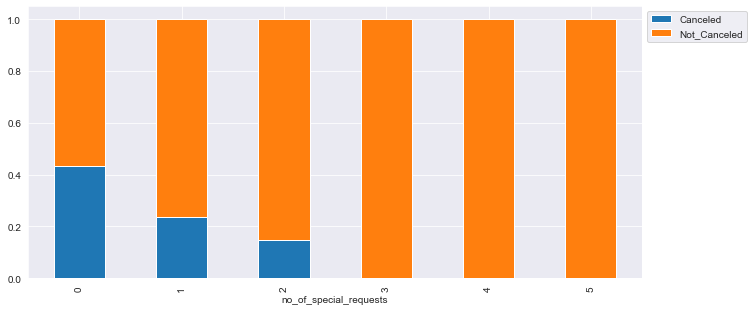

In [107]:
# Booking_status vs no_of_special_requests stacked barplot
stacked_barplot(df1, "no_of_special_requests", "booking_status")

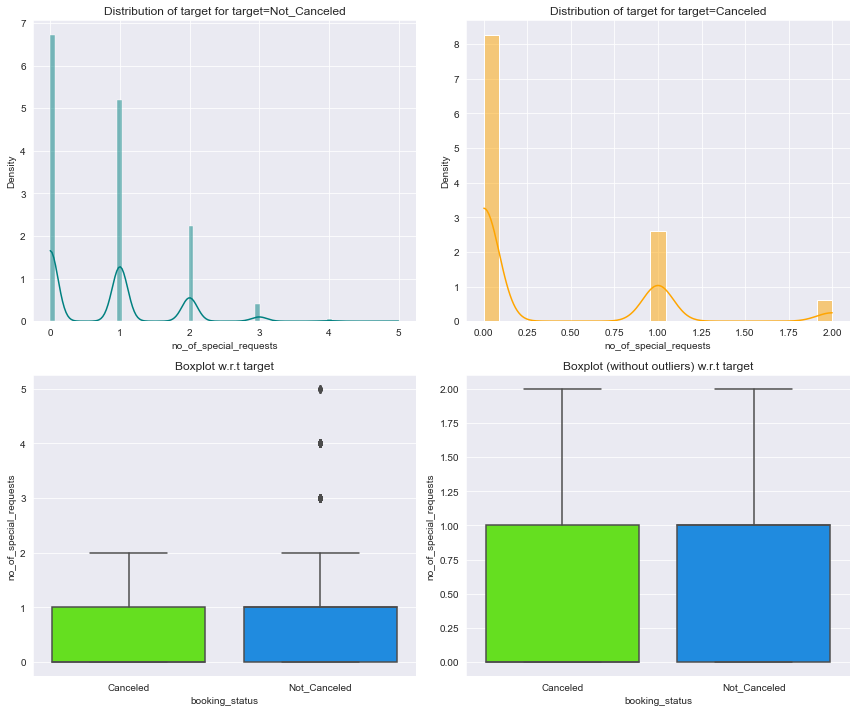

In [108]:
# Booking_status vs no_of_special_requests distribution plot
distribution_plot_wrt_target(df1, "no_of_special_requests", "booking_status")

### Observations for booking_status vs no_of_special_requests
* Interesting to note is that guests that 3 or more special requests have a 100% not canceled rate, which suggests that these requests might not have been fulfilled by other hotels, however, this might be due to small samples of data for guests with 3 or more requests.
* Looking at the density plots, most of the data is 0 speical requests, then 1, and 2.
* Per the boxplot, canceled and not canceled have the same boxplots when excluding not canceled's outliers.

### Overall Observations

* The dataset is very imbalanced. The target variable `booking_status` is imbalanced.
* Other features that are imbalanced are: no_of_adults, no_of_children, no_of_weekend_nights, no_of_week_nights, type_of_meal_plan, required_car_parking_space, room_type_reserved, market_segment_type, repeated_guest, no_of_previous_cancellations, no_of_previous_bookings_not_canceled, and no_of_special_requests.
* Due to the imbalanced nature of the dataset, accuracy isn't a good metric for judging models. Determining what a good model is will be explored in the modeling sections.

**Leading Questions**:
1. What are the busiest months in the hotel?
2. Which market segment do most of the guests come from?
3. Hotel rates are dynamic and change according to demand and customer demographics. What are the differences in room prices in different market segments?
4. What percentage of bookings are canceled? 
5. Repeating guests are the guests who stay in the hotel often and are important to brand equity. What percentage of repeating guests cancel?
6. Many guests have special requirements when booking a hotel room. Do these requirements affect booking cancellation?

### Question 1 - What are the busiest months in the hotel?

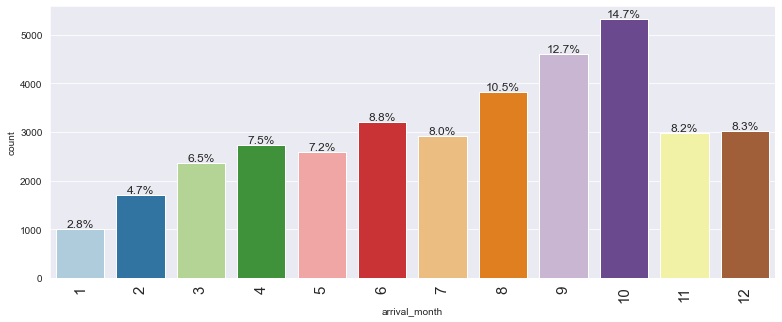

Per the barplot, the top 3 busiest months by bookings are October (10), September (9), and August (8).


In [109]:
# Arrival month for a booking as a percentage
labeled_barplot(df1, "arrival_month", perc = True)

print("Per the barplot, the top 3 busiest months by bookings are October (10), September (9), and August (8).")

### Question 2 - Which market segment do most of the guests come from?

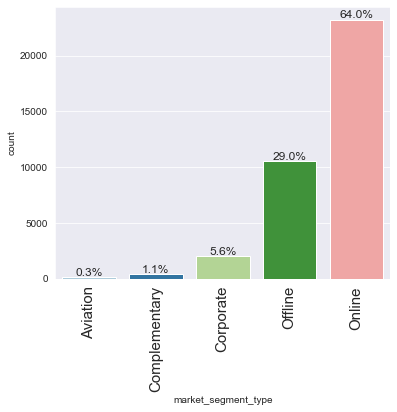

Per the barplot, the top market segment most of the guests come from is Online.


In [110]:
# Market segment type as a percentage for a booking
labeled_barplot(df1, "market_segment_type", perc = True)

print("Per the barplot, the top market segment most of the guests come from is Online.")

### Question 3 - Hotel rates are dynamic and change according to demand and customer demographics. What are the differences in room prices in different market segments?

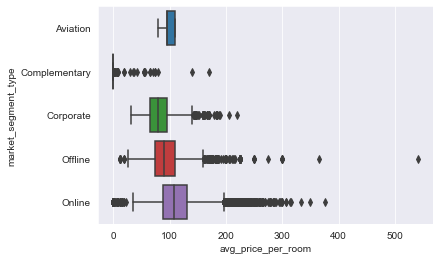

In [111]:
# avg_price_per_room vs market_segment_type
sns.boxplot(data = df1, y = "market_segment_type", x = "avg_price_per_room")
plt.show()

### Observations from the plot
* Online has the biggest price range of any of the segments and multiple outliers on both sides of the boxplot.
* Excluding complementary, corporate bookings have the lowest median, suggesting they might have a speical rate established with INN Hotels and could be a frequent customer.
* People that make bookings offline look to get better pricing than bookings made online minus a few exceptions.
* Aviation has the smallest range of pricing, this might be due to an agreed upon set of rates and room types for aviation companies that have agreements with Inn Hotels.
* Complementary has numerous outliers, however, that might be because the pricing wasn't coded as 0 for all the records since the median is 0 Euros.

### Question 4 - What percentage of bookings are canceled? 

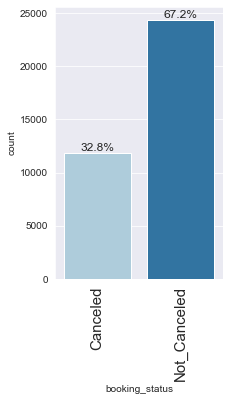

Per the barplot, 32.8% of bookings are canceled.


In [112]:
# Booking status per bookings as a percentage
labeled_barplot(df1, "booking_status", perc = True)

print("Per the barplot, 32.8% of bookings are canceled.")

### Question 5 - Repeating guests are the guests who stay in the hotel often and are important to brand equity. What percentage of repeating guests cancel?

booking_status  Canceled  Not_Canceled    All
repeated_guest                               
All                11885         24390  36275
0                  11869         23476  35345
1                     16           914    930
------------------------------------------------------------------------------------------------------------------------


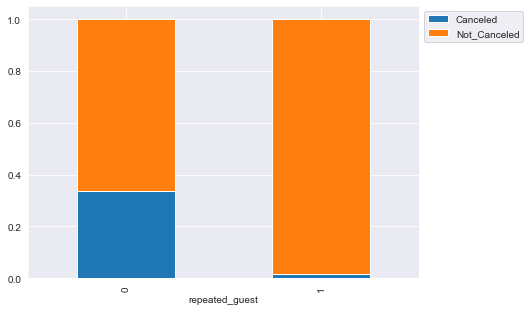

The percentage of repeat guests that canceled is 0.017%


In [113]:
# Booking_status vs repeated_guest stacked barplot
stacked_barplot(df1, "repeated_guest", "booking_status")

percent_repeat_cancel = 16/930
percent_repeat_cancel = round(percent_repeat_cancel, 3)

print("The percentage of repeat guests that canceled is " + str(percent_repeat_cancel) + "%")

### Question 6 - Many guests have special requirements when booking a hotel room. Do these requirements affect booking cancellation?

booking_status          Canceled  Not_Canceled    All
no_of_special_requests                               
All                        11885         24390  36275
0                           8545         11232  19777
1                           2703          8670  11373
2                            637          3727   4364
3                              0           675    675
4                              0            78     78
5                              0             8      8
------------------------------------------------------------------------------------------------------------------------


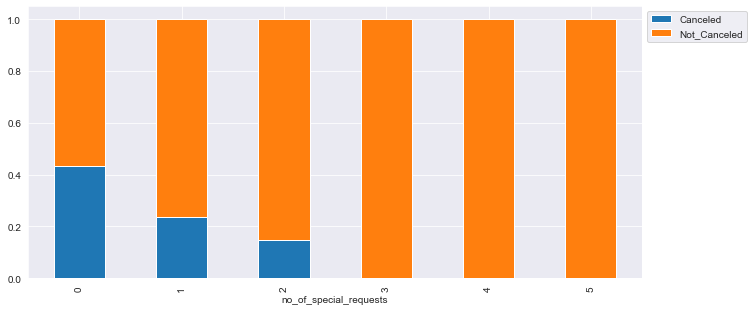

As seen on the barplot, as the number of special requests a guest has increases, the chances of them canceling the booking decreases 100% when the number of requests are 3 or more.


In [114]:
# Booking_status vs no_of_special_requests stacked barplot
stacked_barplot(df1, "no_of_special_requests", "booking_status")

print("As seen on the barplot, as the number of special requests a guest has increases, the chances of them canceling the booking decreases 100% when the number of requests are 3 or more.")

## Data Preprocessing

- Missing value treatment (if needed)
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling 
- Any other preprocessing steps (if needed)

### Missing Value Treatment

In [115]:
# Checking for any missing values
df1.isnull().sum()

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

### There are no missing values so there is no missing value treatments need to happen.

### Feature Engineering

In [116]:
# Right now the dataframe separates out adults and children for booking. To help speed up computation, going to combine the features into one called no_of_people

# Creating a new column called num_of_people that will capture total people for a booking
df1["no_of_people"] = df1["no_of_adults"] + df1["no_of_children"]

# Dropping no_of_adults and no_of_children
df1.drop(["no_of_adults", "no_of_children"], axis = 1, inplace = True)

# Verifying no_of_people column is created and no_of_adults and no_of_children are removed
df1

,Booking_ID,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,no_of_people
0,INN00001,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled,2
1,INN00002,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled,2
2,INN00003,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled,1
3,INN00004,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled,2
4,INN00005,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled,3
36271,INN36272,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled,2
36272,INN36273,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled,2
36273,INN36274,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled,2


In [117]:
# Right now the dataframe separates out number of weekend nights and number of week nights. Since there is no special rate for weekend/weeknight (dataset refers to the average price of the room), going to combine the features into one called no_of_days_stayed to help speed up computation.

# Creating a new column called no_of_days_stayed that will capture total duration of a booking
df1["no_of_days_stayed"] = df1["no_of_weekend_nights"] + df1["no_of_week_nights"]

# Dropping no_of_adults and no_of_children
df1.drop(["no_of_weekend_nights", "no_of_week_nights"], axis = 1, inplace = True)

# Verifying no_of_people column is created and no_of_weekend_nights and no_of_week_nights are removed
df1

,Booking_ID,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,no_of_people,no_of_days_stayed
0,INN00001,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled,2,3
1,INN00002,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled,2,5
2,INN00003,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled,1,3
3,INN00004,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled,2,2
4,INN00005,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled,3,8
36271,INN36272,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled,2,4
36272,INN36273,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled,2,8
36273,INN36274,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled,2,3


### Outlier Detection and Treatment

['required_car_parking_space', 'lead_time', 'arrival_year', 'arrival_month', 'arrival_date', 'repeated_guest', 'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled', 'avg_price_per_room', 'no_of_special_requests', 'no_of_people', 'no_of_days_stayed']


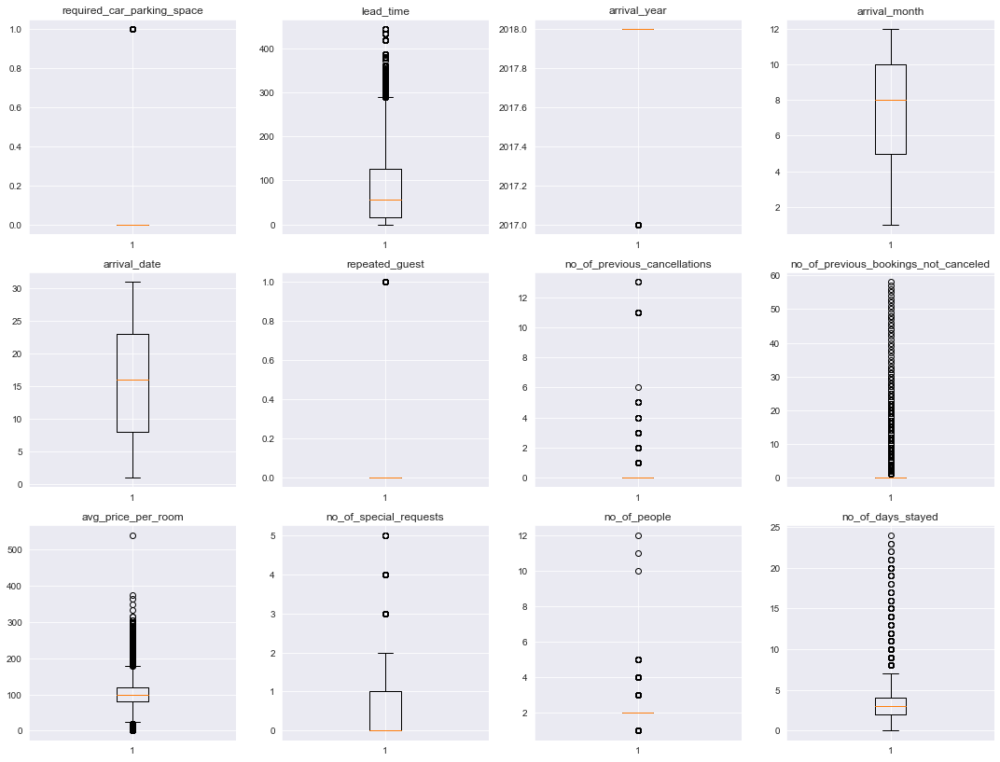

In [118]:
# Outlier detection using boxplot
numeric_columns = df1.select_dtypes(include=np.number).columns.tolist()

print(numeric_columns)
    
plt.figure(figsize=(15, 15))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(df1[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

* Per the plots above, there are outliers when visually looking at different numeric features.
* Since these outliers are from previous booking data provided by INN Hotels, the outliers do play a role in determining the status of a booking since this is genuine data.
* Therefore the outliers won't be dropped.

### Preparing the data for modeling

In [119]:
# Converting booking status values into numerical values since output range for a logistic regression model is between 0 and 1
# Canceled will be encoded as 1, and Not_Canceled will be encoded as 0
convert = {"Not_Canceled" : 0, "Canceled" : 1}
df2 = df1.replace({"booking_status": convert})

# Confirming datatype of booking_status is numerical
print(df2.booking_status.dtype)

# Confirming conversion of booking type to numerical is successful
df2

int64


,Booking_ID,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,no_of_people,no_of_days_stayed
0,INN00001,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,0,2,3
1,INN00002,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,0,2,5
2,INN00003,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,1,1,3
3,INN00004,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,1,2,2
4,INN00005,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,0,3,8
36271,INN36272,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,1,2,4
36272,INN36273,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,0,2,8
36273,INN36274,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,1,2,3


In [120]:
# Dropping "Booking_ID" from dataframe since it is nominal variable that is unique for each booking and doesn't have any predictive power. 
df2 = df2.drop("Booking_ID", axis=1)

In [121]:
# Preparing data for both logistic regression and decision tree modeling

# Splitting data for training and validation
X = df2.drop("booking_status", axis=1)
Y = df2["booking_status"]

# Importing warnings to ignore a Future Warning associated with get_dummies
import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)

# Creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# Adding constant for logistic regression model
X = sm.add_constant(X)

# Splitting into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 1)
print(X_train.shape, X_test.shape)

(25392, 26) (10883, 26)


In [122]:
print("Number of rows in train data =", X_train.shape[0])
print("Number of rows in test data =", X_test.shape[0])

Number of rows in train data = 25392
Number of rows in test data = 10883


In [123]:
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("\n")
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Percentage of classes in training set:
0    0.670644
1    0.329356
Name: booking_status, dtype: float64


Percentage of classes in test set:
0    0.676376
1    0.323624
Name: booking_status, dtype: float64


## EDA

- It is a good idea to explore the data once again after manipulating it.

## Univariate Analysis (for new features)

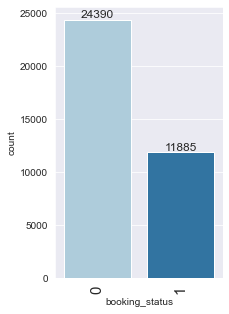

In [124]:
# Booking status for a booking
labeled_barplot(df2, "booking_status")

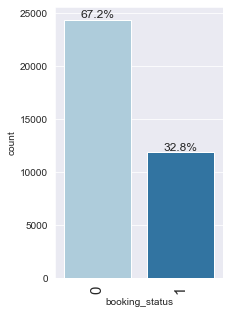

In [125]:
# Booking status for a booking
labeled_barplot(df2, "booking_status", perc = True)

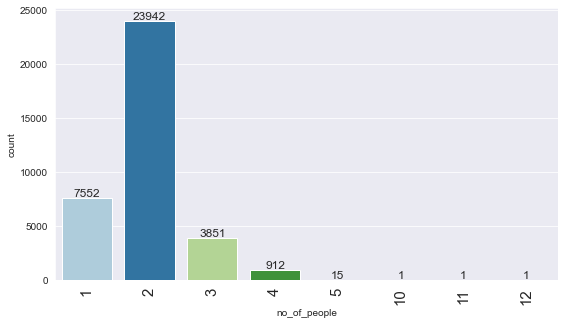

In [126]:
# Number of people for a booking
labeled_barplot(df2, "no_of_people")

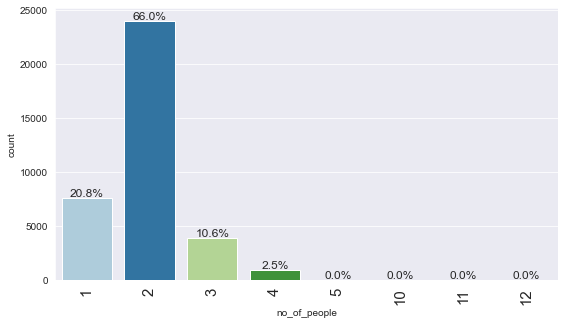

In [127]:
# Number of people for a booking as a percentage
labeled_barplot(df2, "no_of_people", perc = True)

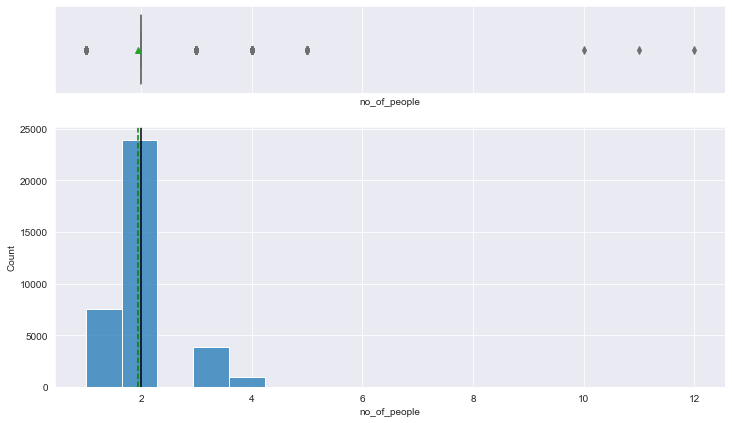

In [128]:
# Number of people for a booking histogram and boxplot
histogram_boxplot(df2, "no_of_people")

### Observations 
* The most frequent number of people for a booking is 2, which is 66% of the data.
* Second most frequent number of people for a booking is 1, which is 20.8% of the data.
* The mean is less than the median.
* There is an outlier to the left of the median and multiple outliers to the right.
* The data is imbalanced with most of the data for 2 people.

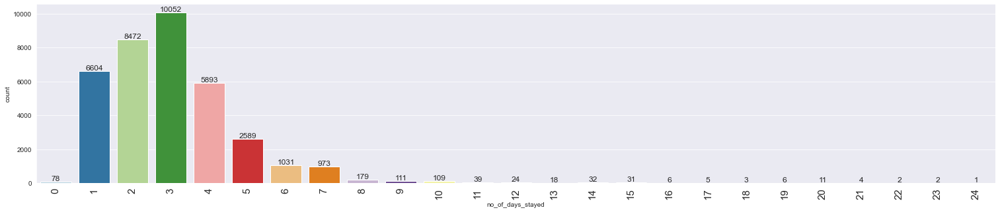

In [129]:
# Number of days stayed for a booking
labeled_barplot(df2, "no_of_days_stayed")

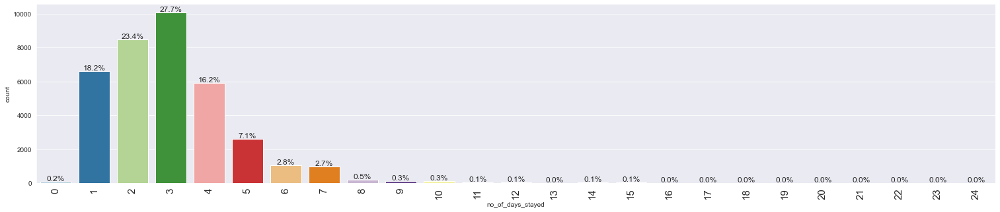

In [130]:
# Number of days stayed for a booking as a percentage
labeled_barplot(df2, "no_of_days_stayed", perc = True)

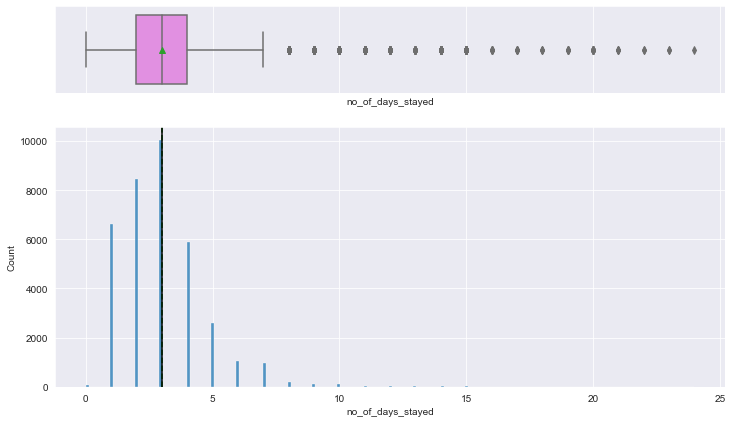

In [131]:
# Number of days stayed for a booking histogram and boxplot
histogram_boxplot(df2, "no_of_days_stayed")

### Observations 
* The most frequent number of days stayed for a booking is 3, which is 27.7% of the data.
* Second most frequent number of days stayed for a booking is 2, which is 23.4% of the data.
* The mean looks to be very close (if not equal to) the median.
* There are multiple outliers to the right of the boxplot.
* The data is imbalanced with most of the data for bookings 1-5 days.

## Bivariate Analysis (for new features)

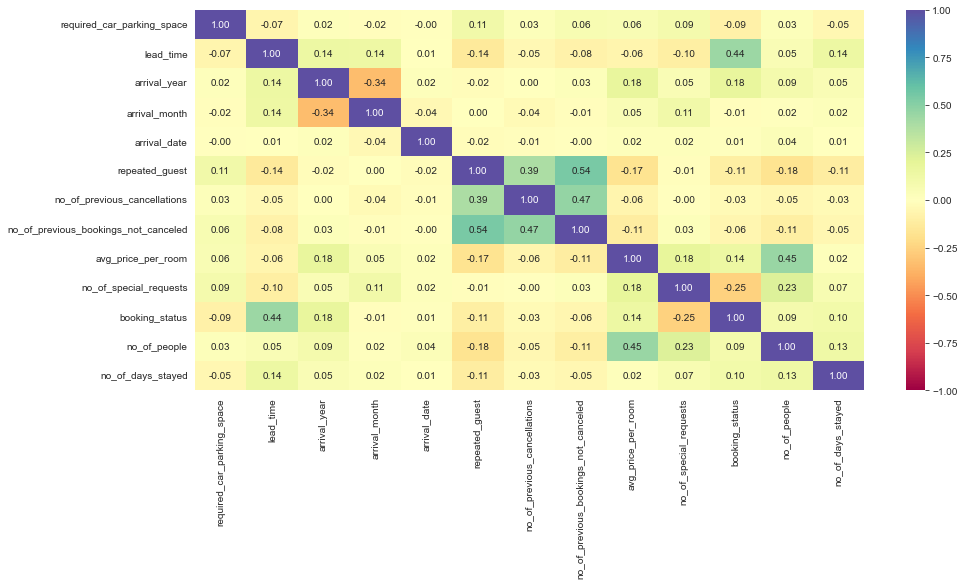

In [132]:
# Correlation heatmap for all numerical variables
plt.figure(figsize=(15, 7))
sns.heatmap(df2.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

### Observations for correlation heatmap
* Highest correlation is same as before, 0.54 between number of previous bookings not canceled and repeated guest.
* Booking status and lead time have a correlation of 0.44, which wasn't captured in the previous heat map since booking status wasn't encoded as a number. 0.44 is the fourth highest correlation value in the table.
* Overall, no significant changes between the correlation heatmaps.

booking_status  Canceled  Not_Canceled    All
no_of_people                                 
All                11885         24390  36275
2                   8280         15662  23942
1                   1809          5743   7552
3                   1392          2459   3851
4                    398           514    912
5                      5            10     15
11                     1             0      1
10                     0             1      1
12                     0             1      1
------------------------------------------------------------------------------------------------------------------------


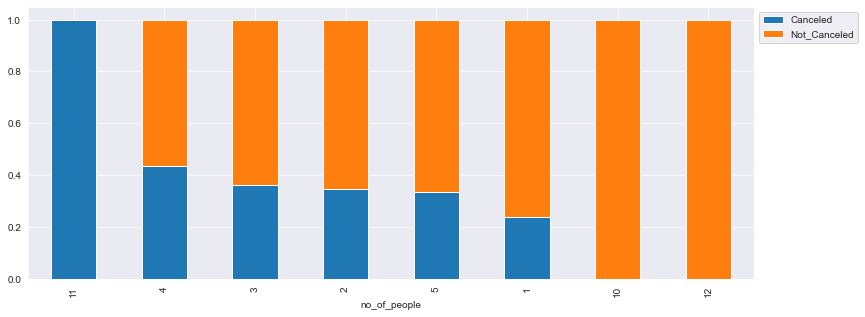

In [133]:
# Booking_status vs no_of_people stacked barplot
stacked_barplot(df1, "no_of_people", "booking_status")

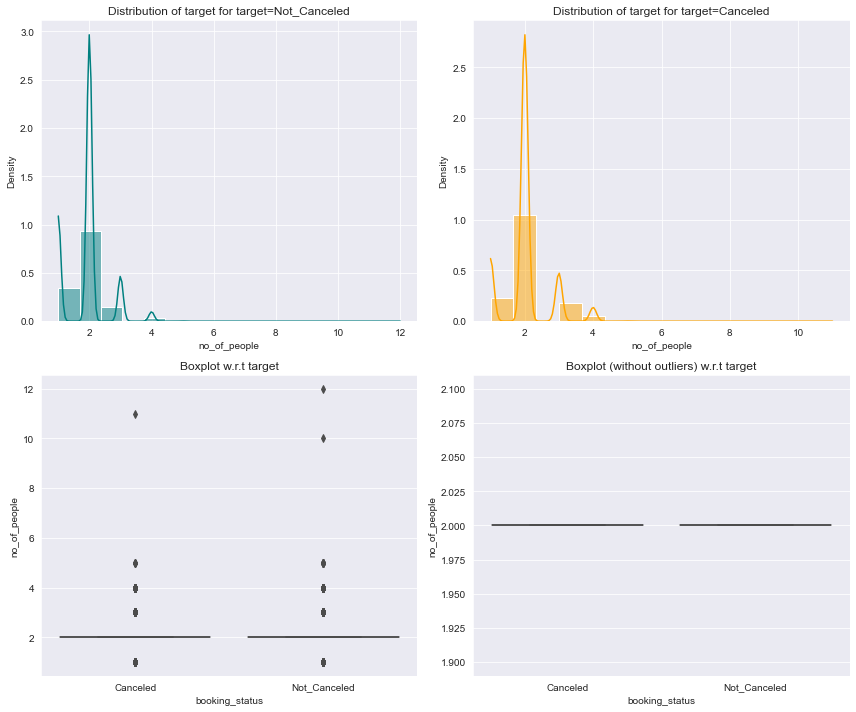

In [134]:
# Booking_status vs no_of_people distribution plot
distribution_plot_wrt_target(df1, "no_of_people", "booking_status")

### Observations for booking_status vs no_of_people
* Bookings with 10 and 12 people have the highest not canceled rate.
* Bookings with 11 people have the highest canceled rate.
* These results might be due to small samples for bookings with 10-12 people.
* Per the density plots, most of the data for bookings is for 2 people by a large margin.
* Per the boxplots, canceled and not canceled have the same median, which is 2.

booking_status     Canceled  Not_Canceled    All
no_of_days_stayed                               
All                   11885         24390  36275
3                      3586          6466  10052
2                      2899          5573   8472
4                      1941          3952   5893
1                      1466          5138   6604
5                       823          1766   2589
6                       465           566   1031
7                       383           590    973
8                        79           100    179
10                       58            51    109
9                        53            58    111
14                       27             5     32
15                       26             5     31
13                       15             3     18
12                       15             9     24
11                       15            24     39
20                        8             3     11
16                        5             1      6
19                  

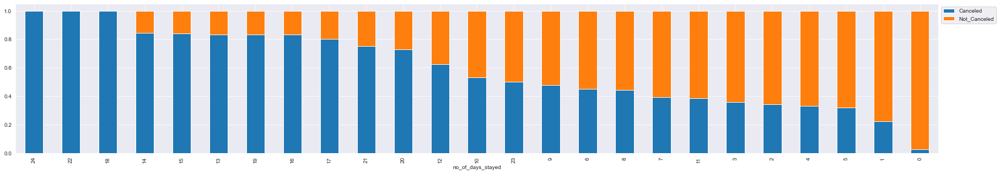

In [135]:
# Booking_status vs no_days_stayed stacked barplot
stacked_barplot(df1, "no_of_days_stayed", "booking_status")

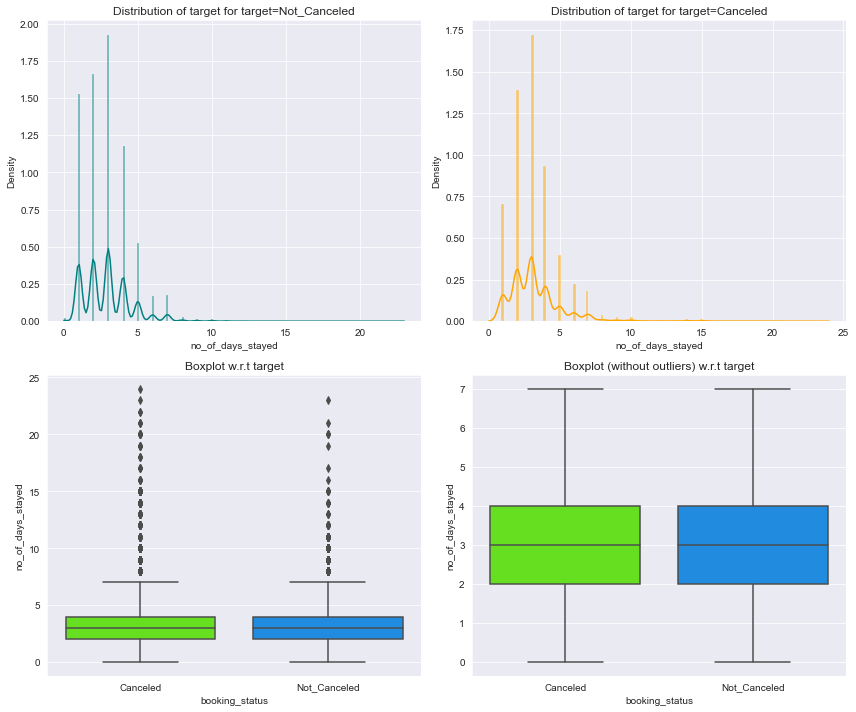

In [136]:
# Booking_status vs no_of_days_stayed distribution plot
distribution_plot_wrt_target(df1, "no_of_days_stayed", "booking_status")

### Observations for booking_status vs no_of_days_stayed
* Bookings for 0 days have the highest not canceled rate.
* Bookings for 18, 22, and 24 days have the highest canceled rate.
* These results might be due to small samples for bookings for 18, 22, and 24 days.
* Per the density plots, most of the data for bookings is for 1-5 days stayed by a large margin.
* Per the boxplots, canceled and not canceled have the same IQR.

# Logistic Regression Modeling

## Checking Multicollinearity

- In order to make statistical inferences from a logistic regression model, it is important to ensure that there is no multicollinearity present in the data.

### Variance Inflation Factor (VIF)
* One way to check for multicollinearity is look at Variance Inflation Factor (VIF) values.

* **Variance  Inflation  Factor**:  Variance  inflation  Factor  measures  the  inflation  in  the variances of the regression coefficients estimates due to collinearities that exist among the  predictors.  It  is  a  measure  of  how  much  the  variance  of  the  estimated  regression coefficient βk is “inflated”by  the  existence  of  correlation  among  the  predictor variables in the model. 

- **General Rule of thumb**:
    - If VIF is 1 then there is no correlation between the $k$th predictor and the remaining predictor variables.
    - If VIF exceeds 5 or is close to exceeding 5, we say there is moderate multicollinearity.
    - If VIF is 10 or exceeding 10, it shows signs of high multicollinearity. 

In [137]:
# Calculating VIF values for different features
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns
vif.round(2)

,VIF Factor,features
0,39412871.11,const
1,1.04,required_car_parking_space
2,1.38,lead_time
3,1.43,arrival_year
4,1.27,arrival_month
5,1.01,arrival_date
6,1.76,repeated_guest
7,1.35,no_of_previous_cancellations
8,1.61,no_of_previous_bookings_not_canceled
9,2.03,avg_price_per_room


* None of the numerical variables show moderate or high multicollinearity.
* The VIF for dummy variables will be ignored.

## Building a Logistic Regression model

In [138]:
# Defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [139]:
# Defining a function to plot the confusion_matrix of a classification model

def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [140]:
# Fitting logistic regression model
logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(disp=False)

print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25366
Method:                           MLE   Df Model:                           25
Date:                Fri, 25 Feb 2022   Pseudo R-squ.:                  0.3291
Time:                        22:11:19   Log-Likelihood:                -10796.
converged:                      False   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                 -928.3326    120.669     -7.693      0.000   -1164.840    -691.825
required_car_parking_space              -1.5941      

## Model performance evaluation

In [141]:
# Model performance evaluation on initial X_train
print("Training performance:")
model_performance_classification_statsmodels(lg, X_train, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.804939,0.629439,0.739534,0.680059


In [142]:
# Dropping predictor columns with highest p-values > 0.05 one by one (ignoring dummy variables)

# First column to drop is arrival_date (p-value = 0.747)
drop_col = "arrival_date"
X_train1 = X_train.drop(drop_col, axis=1)

# Checking if p-values for other variables became < 0.05
print('p-values after dropping', drop_col)
logit1 = sm.Logit(y_train, X_train1.astype(float))
lg1 = logit1.fit(disp=False)

print(lg1.summary())

p-values after dropping arrival_date
                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25367
Method:                           MLE   Df Model:                           24
Date:                Fri, 25 Feb 2022   Pseudo R-squ.:                  0.3291
Time:                        22:11:19   Log-Likelihood:                -10796.
converged:                      False   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                 -928.2536    120.675     -7.692      0.000   -1164.773    -691.734
required_car_par

In [143]:
# Dropping predictor columns with highest p-values > 0.05 one by one (ignoring dummy variables)

# Second column to drop is no_of_previous_bookings_not_canceled (p-value = 0.260)
drop_col = "no_of_previous_bookings_not_canceled"
X_train2 = X_train1.drop(drop_col, axis=1)

# Checking if p-values for other variables became < 0.05
print('p-values after dropping', drop_col)
logit2 = sm.Logit(y_train, X_train2.astype(float))
lg2 = logit2.fit(disp=False)

print(lg2.summary())

p-values after dropping no_of_previous_bookings_not_canceled
                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25368
Method:                           MLE   Df Model:                           23
Date:                Fri, 25 Feb 2022   Pseudo R-squ.:                  0.3290
Time:                        22:11:19   Log-Likelihood:                -10798.
converged:                      False   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                              -926.5791    120.684     -7.678      0.000   -1163.116    -690.042
r

In [144]:
# After dropping arrival_date and no_of_previous_bookings_not_canceled, remaining predictor columns (ignoring dummy variables) now have p-values < 0.05

# Building a new logistic regression model with X_train2
logit2 = sm.Logit(y_train, X_train2.astype(float))
lg2 = logit2.fit(disp=False)

print(lg2.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25368
Method:                           MLE   Df Model:                           23
Date:                Fri, 25 Feb 2022   Pseudo R-squ.:                  0.3290
Time:                        22:11:20   Log-Likelihood:                -10798.
converged:                      False   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                              -926.5791    120.684     -7.678      0.000   -1163.116    -690.042
required_car_parking_space           -1.5936      0.138    -11

### Coefficient interpretations

* There is a mix of coefficients that are negative (required_car_parking_space, arrival_month, repeated_guest, no_of_special requests) and positive (lead_time, arrival_year, no_of_previous_cancellations, avg_price_per_room).
* With the negative coefficients, the chances of a booking getting canceled will go down, whereas with the positive coefficients, the chances of a booking getting canceled will go up.
* In the model, Not_Canceled is encoded as 0, and Canceled is encoded as 1.

In [145]:
# Converting coefficients to odds
odds = np.exp(lg2.params)

# Finding the percentage change
perc_change_odds = (np.exp(lg2.params) - 1) * 100

# Removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# Adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train2.columns).T

,const,required_car_parking_space,lead_time,arrival_year,arrival_month,repeated_guest,no_of_previous_cancellations,avg_price_per_room,no_of_special_requests,no_of_people,no_of_days_stayed,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Meal Plan 3,type_of_meal_plan_Not Selected,room_type_reserved_Room_Type 2,room_type_reserved_Room_Type 3,room_type_reserved_Room_Type 4,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
Odds,0.0,0.203186,1.015782,1.580834,0.959150,0.064462,1.257912,1.018876,0.230258,1.137322,1.062335,1.198417,5.231699e+08,1.315327,0.711305,0.996855,0.747500,0.490268,0.407464,0.252474,2.792858e-15,0.294912,0.109292,0.662046
Change_odd%,-100.0,-79.681395,1.578226,58.083417,-4.085031,-93.553767,25.791192,1.887620,-76.974163,13.732156,6.233493,19.841679,5.231699e+10,31.532705,-28.869544,-0.314541,-25.250026,-50.973184,-59.253642,-74.752550,-1.000000e+02,-70.508789,-89.070769,-33.795434


### Some coefficient interpretations

* `required_car_parking_space`: Holding all other features constant, a unit change in required_car_parking_space will decrease the odds of a person canceling the booking by 0.203 times or a 79.68% decrease in the odds of a booking getting canceled.

* `lead_time`: Holding all other features constant, a unit change in lead_time will increase the odds of a person canceling the booking by 1.016 times or a 1.58% increase in the odds of a booking getting canceled.

* `arrival_year`: Holding all other features constant, a unit change in arrival_year will increase the odds of a person canceling the booking by 1.581 times or a 58.08% increase in the odds of a booking getting canceled.

* `arrival_month`: Holding all other features constant, a unit change in arrival_month will decrease the odds of a person canceling the booking by 0.959 times or a 4.09% decrease in the odds of a booking getting canceled.

* `repeated_guest`: Holding all other features constant, a unit change in repeated_guest will decrease the odds of a person canceling the booking by 0.064 times or a 93.55% decrease in the odds of a booking getting canceled.

* `no_of_previous_cancelations`: Holding all other features constant, a unit change in no_of_previous_cancelations will increase the odds of a person canceling the booking by 1.258 times or a 25.79% increase in the odds of a booking getting canceled.

* `avg_price_per_room`: Holding all other features constant, a unit change in avg_price_per_room will increase the odds of a person canceling the booking by 1.019 times or a 1.89% increase in the odds of a booking getting canceled.

* `no_of_special_requests`: Holding all other features constant, a unit change in no_of_special_requests will decrease the odds of a person canceling the booking by 0.230 times or a 76.97% decrease in the odds of a booking getting canceled.

* `no_of_people`: Holding all other features constant, a unit change in no_of_people will increase the odds of a person canceling the booking by 1.137 times or a 13.73% increase in the odds of a booking getting canceled.

* `no_of_days_stayed`: Holding all other features constant, a unit change in no_of_days_stayed will increase the odds of a person canceling the booking by 1.062 times or a 6.23% increase in the odds of a booking getting canceled.

### Performance Metrics of the final model - 'lg2'

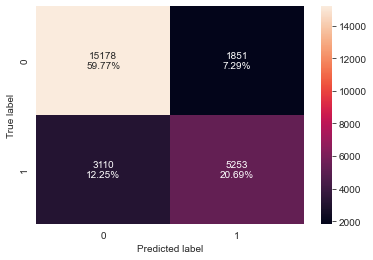

In [146]:
# Creating confusion matrix to check performance on training set
confusion_matrix_statsmodels(lg2, X_train2, y_train)

In [147]:
# Checking model performance on X_train2 and y_train
log_reg_model_train_perf = model_performance_classification_statsmodels(lg2, X_train2, y_train)
print("Training performance:")

log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.804624,0.628124,0.739443,0.679253


### ROC-AUC Curve on training set

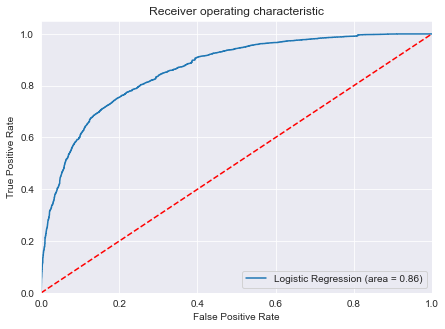

In [148]:
# Generating ROC curve with lg2 and X_train2
logit_roc_auc_train = roc_auc_score(y_train, lg2.predict(X_train2))
fpr, tpr, thresholds = roc_curve(y_train, lg2.predict(X_train2))
plt.figure(figsize = (7, 5))
plt.plot(fpr, tpr, label = "Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc = "lower right")
plt.show()

### Optimal threshold using AUC-ROC curve

In [149]:
# Looking to improve recall score by changing the model threshold per AUC-ROC curve

# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, lg2.predict(X_train2))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.3490219110870503


### Checking model performance on training set with optimal threshold from AUC-ROC

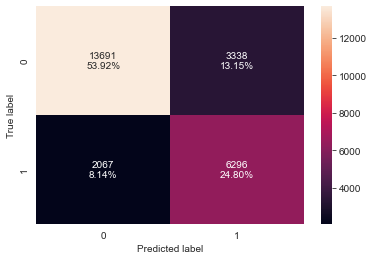

In [150]:
# Creating confusion matrix
confusion_matrix_statsmodels(lg2, X_train2, y_train, threshold = optimal_threshold_auc_roc)

In [151]:
# Checking model performance for this model with AUC-ROC optimal threshold
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg2, X_train2, y_train, threshold = optimal_threshold_auc_roc
)
print("Training performance:")
log_reg_model_train_perf_threshold_auc_roc

Training performance:


,Accuracy,Recall,Precision,F1
0,0.787138,0.75284,0.653519,0.699672


### Precision-Recall Curve

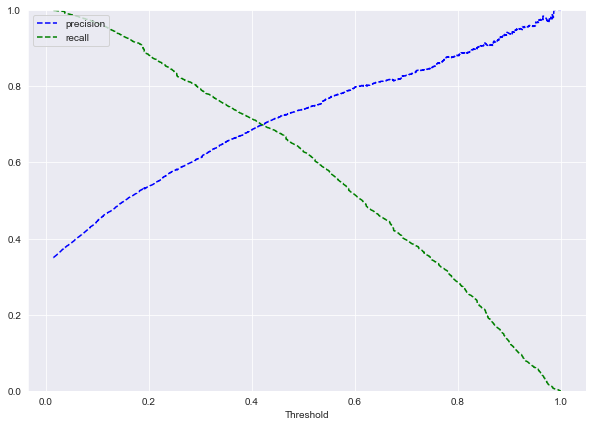

In [152]:
# Looking to see if a better threshold can be found with Precision-Recall Curve
y_scores = lg2.predict(X_train2)
prec, rec, tre = precision_recall_curve(y_train, y_scores)

def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])

plt.figure(figsize=(10, 7))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()

### At threshold around 0.42 there is equal precision and recall but taking a step back and selecting a value around 0.39 will provide a higher recall and a good precision.

In [153]:
# Setting the threshold
optimal_threshold_curve = 0.39

### Checking model performance with optimal threshold curve on training set

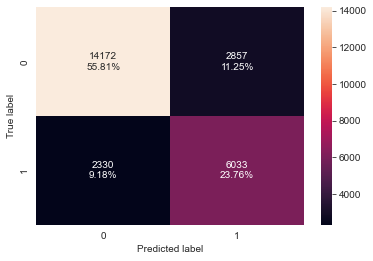

In [154]:
# Creating confusion matrix
confusion_matrix_statsmodels(lg2, X_train2, y_train, threshold = optimal_threshold_curve)

In [155]:
log_reg_model_train_perf_threshold_curve = model_performance_classification_statsmodels(
    lg2, X_train2, y_train, threshold = optimal_threshold_curve
)
print("Training performance:")
log_reg_model_train_perf_threshold_curve

Training performance:


,Accuracy,Recall,Precision,F1
0,0.795723,0.721392,0.678628,0.699357


## Final Model Summary

### Checking the performance on the test set

**Dropping the columns from the test set that were dropped from the training set**

In [156]:
X_test1 = X_test[X_train2.columns].astype(float)

**Using model with default threshold**

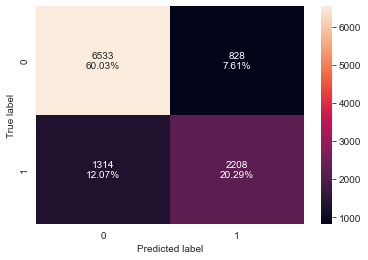

In [157]:
# Creating confusion matrix
confusion_matrix_statsmodels(lg2, X_test1, y_test)

In [158]:
# Logistic regression model of the test set
log_reg_model_test_perf = model_performance_classification_statsmodels(
    lg2, X_test1, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.803179,0.626917,0.727273,0.673376


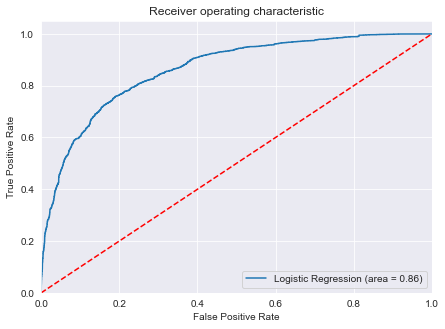

In [159]:
# ROC-AUC Curve for test set
logit_roc_auc_train = roc_auc_score(y_test, lg2.predict(X_test1))
fpr, tpr, thresholds = roc_curve(y_test, lg2.predict(X_test1))
plt.figure(figsize = (7, 5))
plt.plot(fpr, tpr, label= "Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc = "lower right")
plt.show()

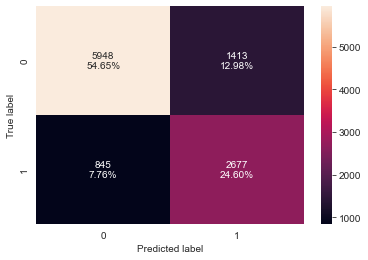

In [160]:
# Creating confusion matrix with model threshold = 0.35
confusion_matrix_statsmodels(lg2, X_test1, y_test, threshold = optimal_threshold_auc_roc)

In [161]:
# Checking model performance for this model with optimal threhold AUC-ROC
log_reg_model_test_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg2, X_test1, y_test, threshold = optimal_threshold_auc_roc
)
print("Test performance:")
log_reg_model_test_perf_threshold_auc_roc

Test performance:


,Accuracy,Recall,Precision,F1
0,0.79252,0.76008,0.654523,0.703363


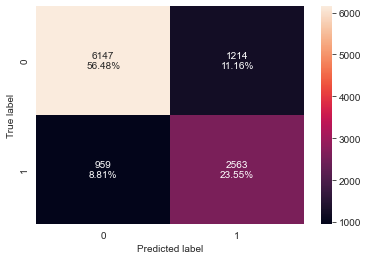

In [162]:
# Creating confusion matrix with model threshold = 0.39
confusion_matrix_statsmodels(lg2, X_test1, y_test, threshold = optimal_threshold_curve)

In [163]:
# Checking model performance for this model with optimal threshold curve
log_reg_model_test_perf_threshold_curve = model_performance_classification_statsmodels(
    lg2, X_test1, y_test, threshold = optimal_threshold_curve
)
print("Test performance:")
log_reg_model_test_perf_threshold_curve

Test performance:


,Accuracy,Recall,Precision,F1
0,0.800331,0.727712,0.678581,0.702288


In [164]:
# Training performance comparison

models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        log_reg_model_train_perf_threshold_auc_roc.T,
        log_reg_model_train_perf_threshold_curve.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression statsmodel",
    "Logistic Regression-0.35 Threshold",
    "Logistic Regression-0.39 Threshold",
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression statsmodel,Logistic Regression-0.35 Threshold,Logistic Regression-0.39 Threshold
Accuracy,0.804624,0.787138,0.795723
Recall,0.628124,0.752840,0.721392
Precision,0.739443,0.653519,0.678628
F1,0.679253,0.699672,0.699357


In [165]:
# Testing performance comparison

models_test_comp_df = pd.concat(
    [
        log_reg_model_test_perf.T,
        log_reg_model_test_perf_threshold_auc_roc.T,
        log_reg_model_test_perf_threshold_curve.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression statsmodel",
    "Logistic Regression-0.35 Threshold",
    "Logistic Regression-0.39 Threshold",
]

print("Test set performance comparison:")
models_test_comp_df

Test set performance comparison:


,Logistic Regression statsmodel,Logistic Regression-0.35 Threshold,Logistic Regression-0.39 Threshold
Accuracy,0.803179,0.792520,0.800331
Recall,0.626917,0.760080,0.727712
Precision,0.727273,0.654523,0.678581
F1,0.673376,0.703363,0.702288


## Conclusions

* All the models are giving a generalized performance on training and test set.
* The highest recall (correct positive predictions relative to total actual positives) is 75.2% on the training set and 76.0% on the test set both from the Logistic Regression model using 0.35 as a threshold.
* Using the Logistic Regression statsmodelmodel with the default threshold will give the lowest recall compared to the other two models (0.35 and 0.39 threshold models), and the highest precision compared to the other two models.
    * The Logistic Regression statsmodel with the default threshold will help the hotel save resources but lose on potential customers.
* Using either Logistic Regression model with 0.35 or the 0.39 threshold models will give a significantly higher recall compared to the Logistic Regression statsmodel. However, the precision scores for both 0.35 and the 0.39 threshold models is lower than the Logistic Regression statsmodel with the default threshold. 
    * Either model will help the hotel identify potential customers effectively but the cost of resources will be higher.
* The Logistic Regression 0.35 Threshold has the highest F1 score for the training and test data and has just a tad higher F1 score than the Logistic Regression 0.39 threshold model.

# Decision Tree Modeling

### Model evaluation criterion

### Model can make wrong predictions as:

1. False Positive: Predicting a customer will not cancel their booking but in reality the customer canceled the booking leading to loss of revenue for INN Hotels in the form of getting the room ready, not being able to resell the room, etc.

2. False Negative: Predicting a customer will cancel their booking but in reality the customer did not cancel the booking leading to loss of opportunity if INN Hotels decided to try to book the room to someone else at a lower price.

### Which case is more important? 

* If we predict a customer who was not going to cancel their booking as a customer who was going to cancel their booking.

### How to reduce this loss i.e need to reduce False Negatives?
*  `recall` should be maximized, the greater the recall higher the chances of minimizing the false negatives.

## Building a Decision Tree model

* The decision model will be built using the DecisionTreeClassifier function. Using default 'gini' criteria to split. 
* Since the dataset is imbalanced (Class 0: 67.2% of bookings didn't cancel and Class 1: 32.8% of bookings canceled) the model will skew towards bookings that didn't cancel (the dominant class) if no weighting is introduced.
* Going to specify class_weight = "balanced". Per Sklearn documentation The “balanced” mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data.
* class_weight is a hyperparameter for the decision tree classifier.

In [166]:
# Defining the decision tree model
model = DecisionTreeClassifier(criterion = "gini", class_weight = "balanced", random_state = 1)

# Fitting the decision tree
model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=1)

In [167]:
# Function to calculate recall score
def get_recall_score(model, predictors, target):
    """
    model: classifier
    predictors: independent variables
    target: dependent variable
    
    """
    prediction = model.predict(predictors)
    return recall_score(target, prediction)

In [168]:
# Defining confusion matrix for decision tree
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [169]:
# Defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [170]:
# Checking decision tree performance on training set
decision_tree_perf_train = model_performance_classification_sklearn(
    model, X_train, y_train
)
decision_tree_perf_train

,Accuracy,Recall,Precision,F1
0,0.993108,0.995097,0.984153,0.989595


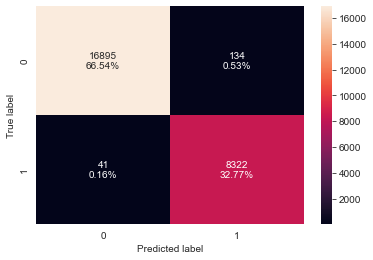

In [171]:
# Checking decision tree performance on training set
confusion_matrix_sklearn(model, X_train, y_train)

In [172]:
# Checking decision tree performance on test set
decision_tree_perf_test = model_performance_classification_sklearn(model, X_test, y_test)
decision_tree_perf_test

,Accuracy,Recall,Precision,F1
0,0.863089,0.810619,0.776237,0.793056


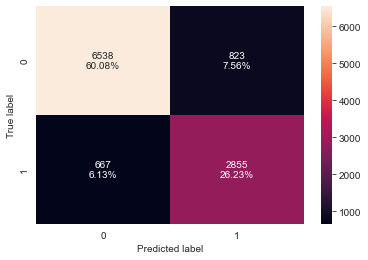

In [173]:
# Checking decision tree performance on test set
confusion_matrix_sklearn(model, X_test, y_test)

### Initial Observation

* The model is giving a wide disparity in Accuracy, Recall, Precision, and F1 metric with the model performing significantly better on the training data than the test data. This suggests the model is overfit and pruning might need to be cosidered.

## Visualizing the Decision Tree

In [174]:
# Creating a list of column names
feature_names = X_train.columns.to_list()

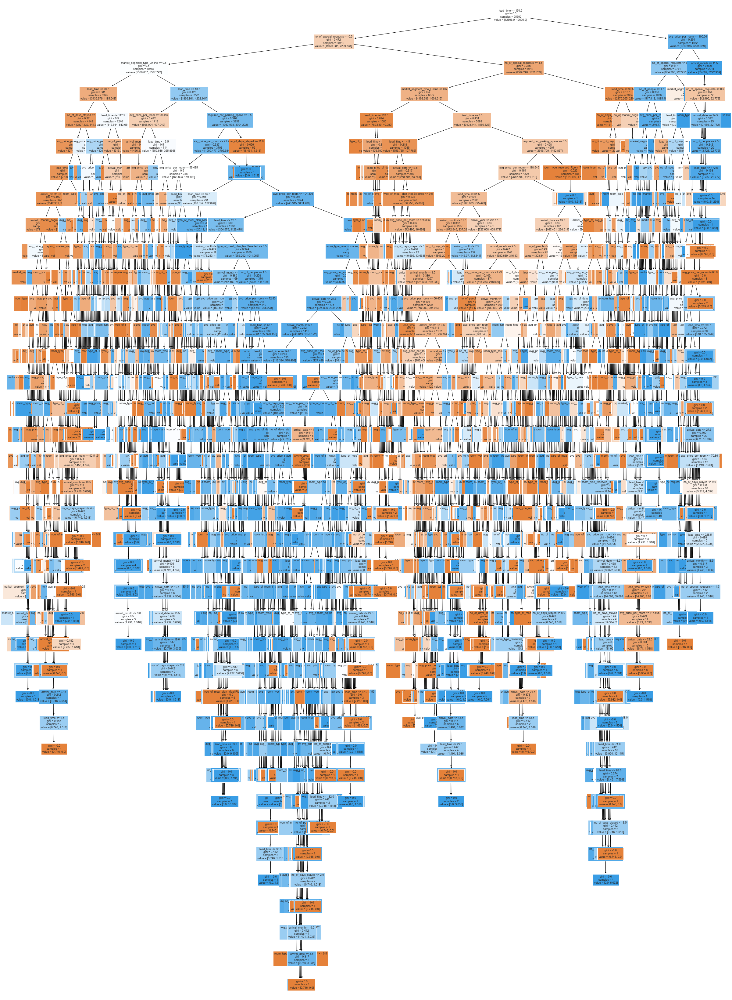

In [175]:
# Plotting decision tree
plt.figure(figsize=(40, 60))
out = tree.plot_tree(
    model,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

In [176]:
# Text report showing the rules of a decision tree

print(tree.export_text(model, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_days_stayed <= 5.50
|   |   |   |   |   |--- avg_price_per_room <= 201.50
|   |   |   |   |   |   |--- lead_time <= 74.50
|   |   |   |   |   |   |   |--- arrival_month <= 5.50
|   |   |   |   |   |   |   |   |--- arrival_date <= 27.50
|   |   |   |   |   |   |   |   |   |--- lead_time <= 59.50
|   |   |   |   |   |   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 16
|   |   |   |   |   |   |   |   |   |   |--- market_segment_type_Offline >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 11
|   |   |   |   |   |   |   |   |   |--- lead_time >  59.50
|   |   |   |   |   |   |   |   |   |   |--- arrival_date <= 16.50
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [19.38, 0.00] class: 0
| 

### Looking at the visual decision tree, and the text report of the decision tree, the tree is very complex with lots of decision nodes and branches, which explains why it performed well with training data and not as well with test data.

In [177]:
# Importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        model.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                                               Imp
lead_time                             3.595298e-01
avg_price_per_room                    1.551888e-01
market_segment_type_Online            9.406970e-02
arrival_date                          9.370397e-02
no_of_special_requests                8.657037e-02
arrival_month                         6.692246e-02
no_of_days_stayed                     5.449526e-02
no_of_people                          3.232946e-02
arrival_year                          1.542329e-02
market_segment_type_Offline           9.894276e-03
required_car_parking_space            7.758533e-03
room_type_reserved_Room_Type 4        7.357731e-03
type_of_meal_plan_Not Selected        6.934528e-03
room_type_reserved_Room_Type 2        2.714500e-03
type_of_meal_plan_Meal Plan 2         2.570490e-03
room_type_reserved_Room_Type 5        1.395219e-03
repeated_guest                        1.077451e-03
room_type_reserved_Room_Type 6        8.055942e-04
market_segment_type_Corporate  

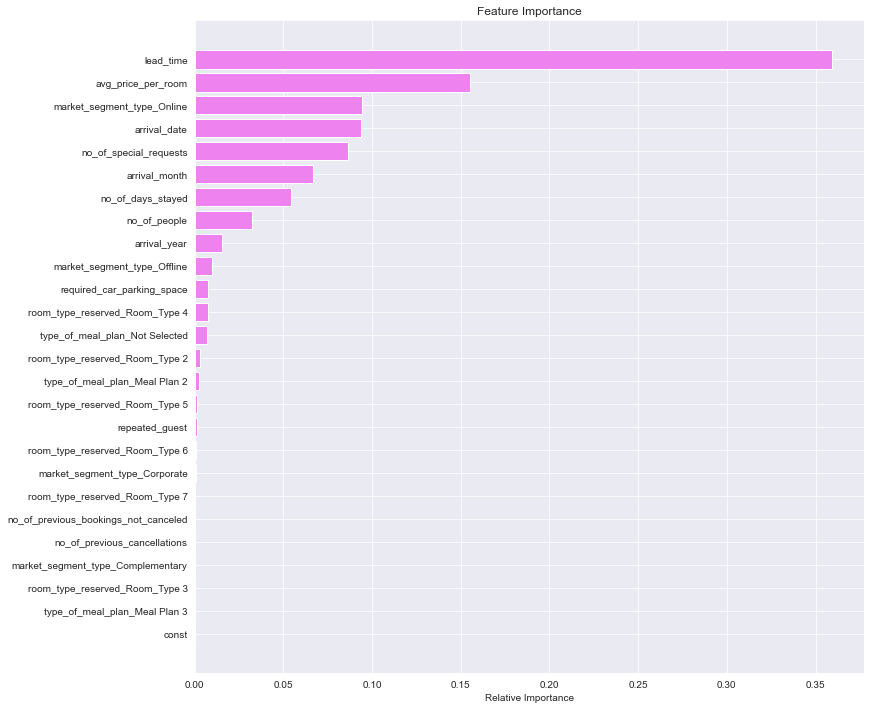

In [178]:
# Feature Importance plot showing the features and their importance for in determining booking status 
importances = model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importance")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

### The top three features for determing if a booking is canceled is lead_time, avg_price_per_room, and arrival_date.

### Using GridSearch for Hyperparameter tuning of our tree model 
* Looking to see if model performance on test data can be improved by tuning hyperparameters. Going to use class_weight = "balanced" as before.

In [179]:
# Choose the type of classifier.
estimator = DecisionTreeClassifier(random_state=1, class_weight = "balanced")

# Grid of parameters to choose from

parameters = {
    "max_depth": [np.arange(2, 50, 5), None],
    "criterion": ["entropy", "gini"],
    "splitter": ["best", "random"],
    "min_impurity_decrease": [0.000001, 0.00001, 0.0001],
}

# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
estimator.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', min_impurity_decrease=0.0001,
                       random_state=1)

### Checking performance on training set (Hyperparameter tuned decision tree)

In [180]:
decision_tree_tune_perf_train = model_performance_classification_sklearn(
    estimator, X_train, y_train
)
decision_tree_tune_perf_train

,Accuracy,Recall,Precision,F1
0,0.882443,0.918331,0.769385,0.837285


#### After hyperparameter tuning, the recall has decreased for the training set with hyperparameter tuning.

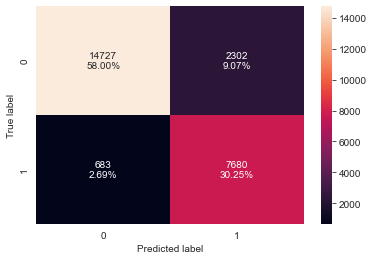

In [181]:
confusion_matrix_sklearn(estimator, X_train, y_train)

### Checking performance on test set (Hyperparameter tuned decision tree)

In [182]:
decision_tree_tune_perf_test = model_performance_classification_sklearn(
    estimator, X_test, y_test
)

decision_tree_tune_perf_test

,Accuracy,Recall,Precision,F1
0,0.846733,0.871664,0.716286,0.786373


#### After hyperparameter tuning, the recall has increased for the test set with hyperparameter tuning.

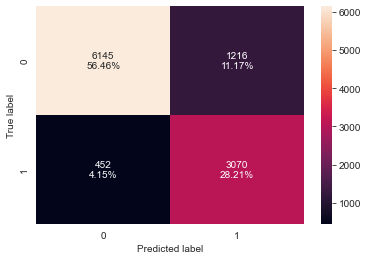

In [183]:
confusion_matrix_sklearn(estimator, X_test, y_test)

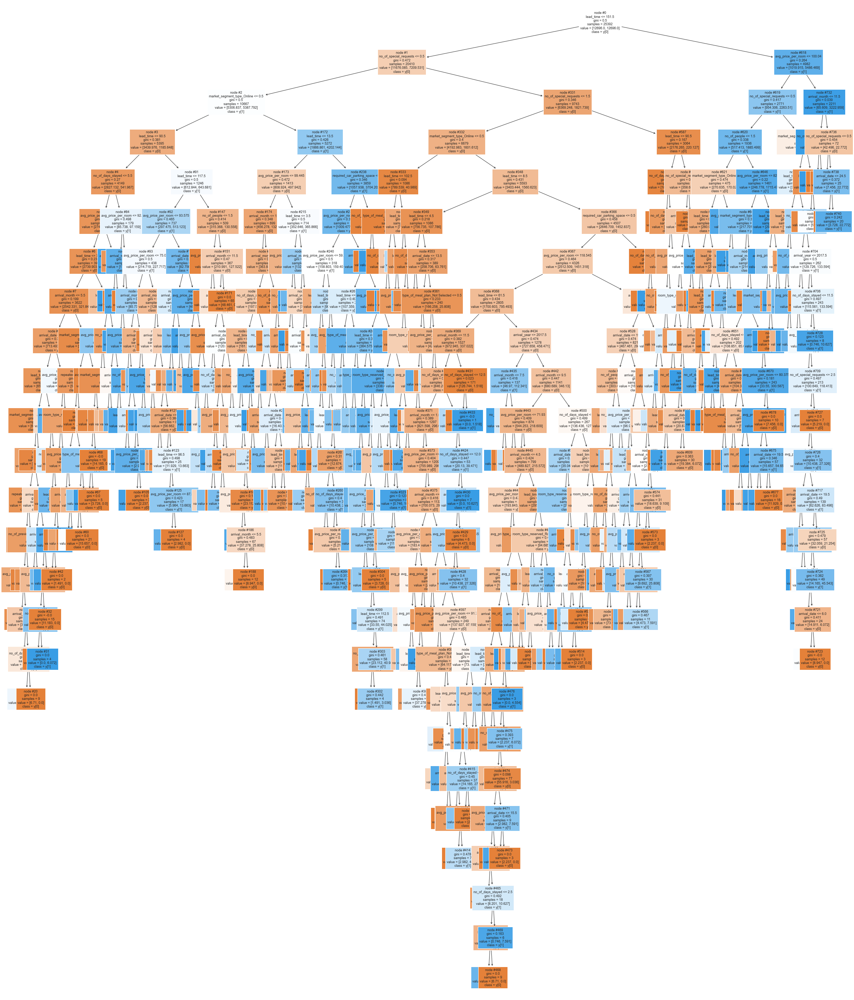

In [184]:
# Plotting decision tree with hyperparameters tuned
plt.figure(figsize=(40, 50))

tree.plot_tree(
    estimator,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

In [185]:
# Text report showing the rules of a decision tree

print(tree.export_text(estimator, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_days_stayed <= 5.50
|   |   |   |   |   |--- avg_price_per_room <= 201.50
|   |   |   |   |   |   |--- lead_time <= 74.50
|   |   |   |   |   |   |   |--- arrival_month <= 5.50
|   |   |   |   |   |   |   |   |--- arrival_date <= 27.50
|   |   |   |   |   |   |   |   |   |--- lead_time <= 59.50
|   |   |   |   |   |   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 7
|   |   |   |   |   |   |   |   |   |   |--- market_segment_type_Offline >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [383.21, 16.70] class: 0
|   |   |   |   |   |   |   |   |   |--- lead_time >  59.50
|   |   |   |   |   |   |   |   |   |   |--- arrival_date <= 16.50
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [19.38, 0.00] class: 

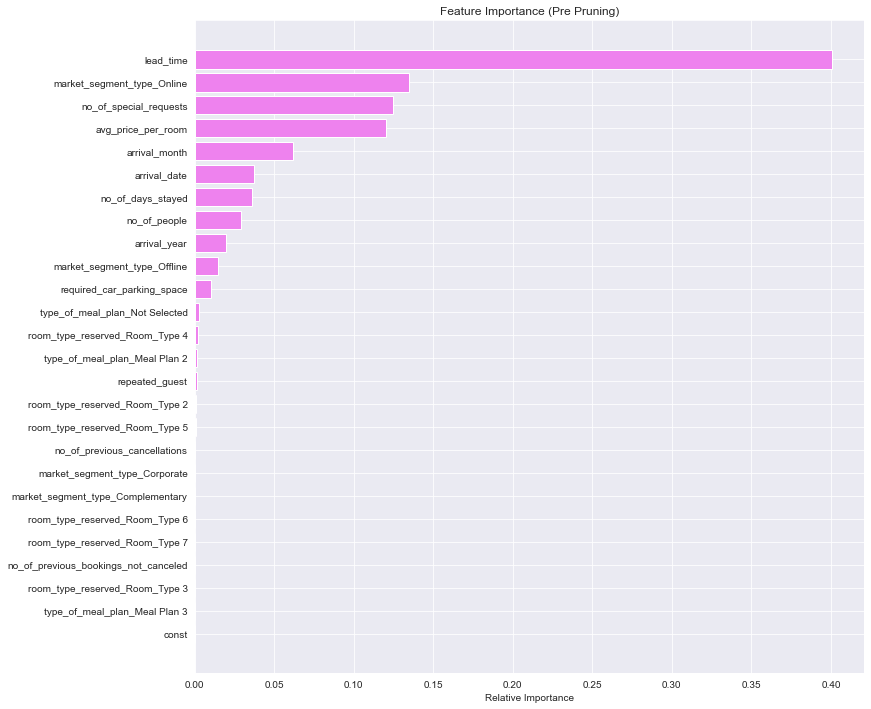

In [186]:
# Visualizing feature importance
importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importance (Pre Pruning)")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

### After hyperparameter tuning, the decision tree looks simpler compared to the non-hyperparameter tuned decision tree, and improvement was seen in recall for test data. However, the decision tree still looks complex. Will try pruning to see if it would further simplify decision tree and if recall can be further improved.

## Do we need to prune the tree?

### Yes, the tree needs to be pruned as it still is complex after hyperparameter tuning. Will utilize Cost Complexity Pruning.

## Cost Complexity Pruning


The `DecisionTreeClassifier` provides parameters such as ``min_samples_leaf`` and ``max_depth`` to prevent a tree from overfiting. Cost complexity pruning provides another option to control the size of a tree. In `DecisionTreeClassifier`, this pruning technique is parameterized by the cost complexity parameter, ``ccp_alpha``. Greater values of ``ccp_alpha`` increase the number of nodes pruned. 

### Total impurity of leaves vs effective alphas of pruned tree

Minimal cost complexity pruning recursively finds the node with the "weakest link". The weakest link is characterized by an effective alpha, where the nodes with the smallest effective alpha are pruned first. To get an idea of what values of ``ccp_alpha`` could be appropriate, scikit-learn provides `DecisionTreeClassifier.cost_complexity_pruning_path` that returns the effective alphas and the corresponding total leaf impurities at each step of the pruning process. As alpha increases, more of the tree is pruned, which increases the total impurity of its leaves.

In [187]:
clf = DecisionTreeClassifier(random_state=1, class_weight = "balanced")
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [188]:
# Looking at alpha values and impurities
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000e+00,0.008376
1,2.933821e-20,0.008376
2,2.933821e-20,0.008376
3,2.933821e-20,0.008376
4,2.933821e-20,0.008376
...,...,...
1855,8.901596e-03,0.328058
1856,9.802243e-03,0.337860
1857,1.271875e-02,0.350579
1858,3.412090e-02,0.418821


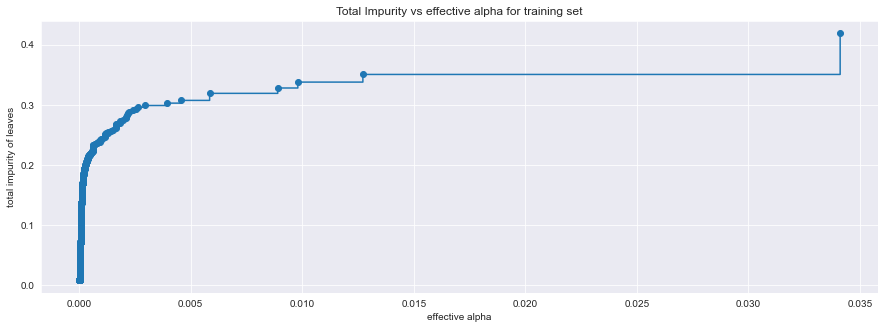

In [189]:
# Generating a plot showing Total Impurity vs. Effective Alpha for the training set

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

In [190]:
# Now going to train a decision tree using the effective alphas. The last value in ccp_alphas is the alpha value that prunes the whole tree, leaving the tree, clfs[-1], with one node.

clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha, class_weight = "balanced")
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.08117914389137182


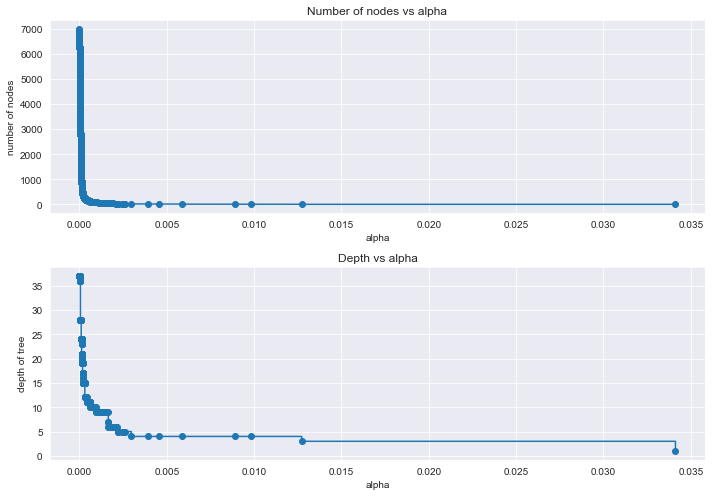

In [191]:
# For the remainder, removing the last element in clfs and ccp_alphas, because it is the trivial tree with only one node. Here we show that the number of nodes and tree depth decreases as alpha increases.

# Generating a plot of Number of nodes vs alpha and Depth vs alpha

clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

### Recall vs alpha for training and testing sets

In [192]:
# Making a list of recall values from training set

recall_train = []
for clf in clfs:
    pred_train = clf.predict(X_train)
    values_train = recall_score(y_train, pred_train)
    recall_train.append(values_train)

In [193]:
# Making a list of recall values from test set

recall_test = []
for clf in clfs:
    pred_test = clf.predict(X_test)
    values_test = recall_score(y_test, pred_test)
    recall_test.append(values_test)

In [194]:
# Caclulating train and test scores
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

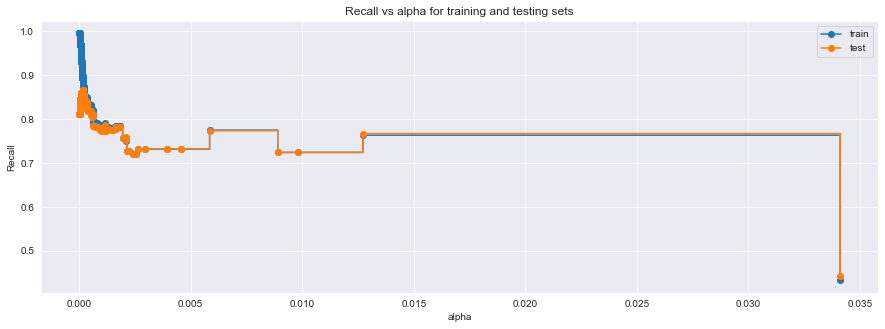

In [195]:
# Comparing Recall and Alpha for training and test sets

fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [196]:
# Creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=0.00015477722021374038,
                       class_weight='balanced', random_state=1)


In [197]:
best_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.00015477722021374038,
                       class_weight='balanced', random_state=1)

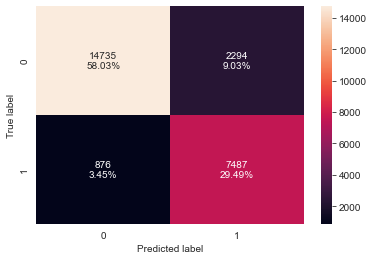

In [198]:
# Checking model performance on training set
confusion_matrix_sklearn(best_model, X_train, y_train)

In [199]:
# Checking model performance on training set
decision_tree_postpruned_perf_train = model_performance_classification_sklearn(
    best_model, X_train, y_train
)
decision_tree_postpruned_perf_train

,Accuracy,Recall,Precision,F1
0,0.875158,0.895253,0.765464,0.825287


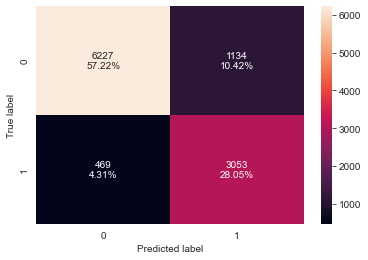

In [200]:
# Checking model performance on test set
confusion_matrix_sklearn(best_model, X_test, y_test)

In [201]:
# Checking model performance on test set
decision_tree_postpruned_perf_test = model_performance_classification_sklearn(
    best_model, X_test, y_test
)
decision_tree_postpruned_perf_test

,Accuracy,Recall,Precision,F1
0,0.852706,0.866837,0.729162,0.792061


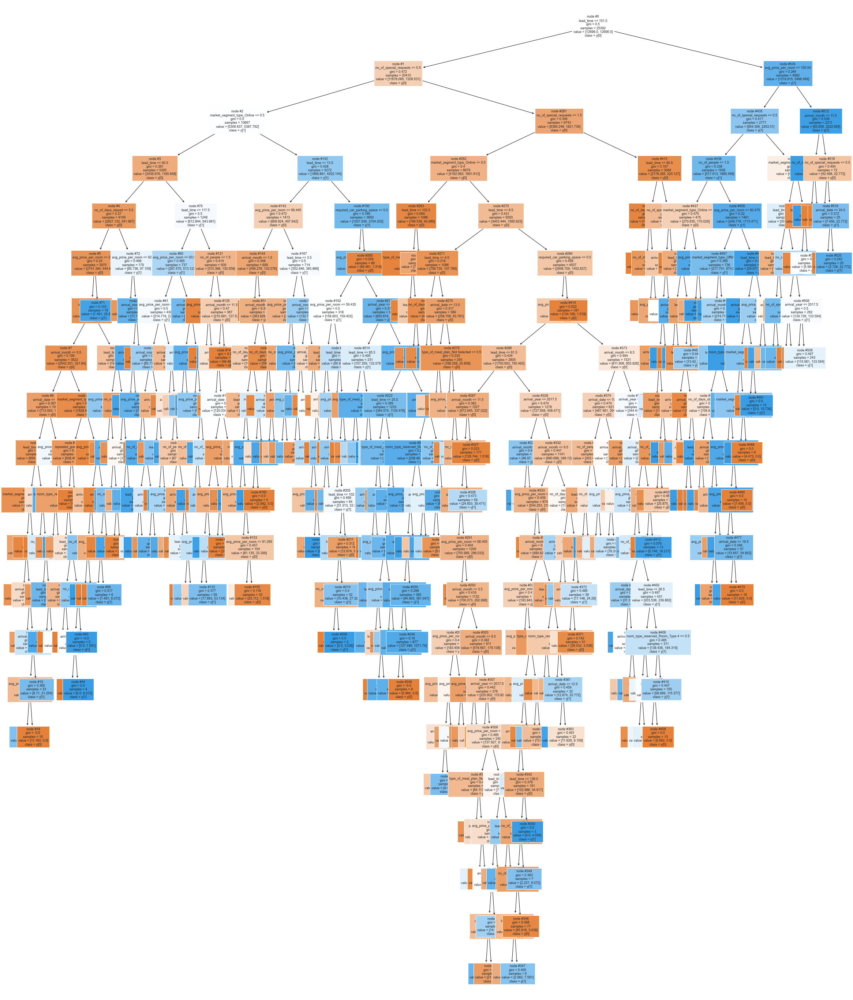

In [202]:
# Visualizing pruned tree
plt.figure(figsize=(40, 50))

out = tree.plot_tree(
    best_model,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()
plt.show()

In [203]:
# Text report showing the rules of a pruned decision tree

print(tree.export_text(best_model, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_days_stayed <= 5.50
|   |   |   |   |   |--- avg_price_per_room <= 201.50
|   |   |   |   |   |   |--- lead_time <= 74.50
|   |   |   |   |   |   |   |--- arrival_month <= 5.50
|   |   |   |   |   |   |   |   |--- arrival_date <= 27.50
|   |   |   |   |   |   |   |   |   |--- lead_time <= 59.50
|   |   |   |   |   |   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- market_segment_type_Offline >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [383.21, 16.70] class: 0
|   |   |   |   |   |   |   |   |   |--- lead_time >  59.50
|   |   |   |   |   |   |   |   |   |   |--- arrival_date <= 16.50
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [19.38, 0.00] class: 

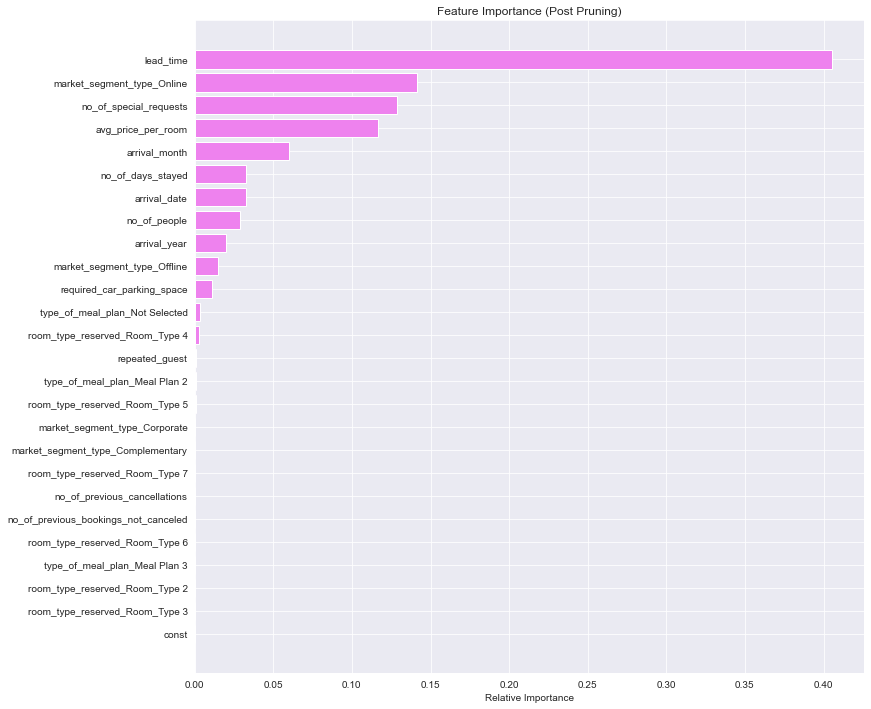

In [204]:
# Visualizing feature importance
importances = best_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importance (Post Pruning)")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [205]:
# Training performance comparison

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_train.T,
        decision_tree_tune_perf_train.T,
        decision_tree_postpruned_perf_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree sklearn",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree sklearn,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.993108,0.882443,0.875158
Recall,0.995097,0.918331,0.895253
Precision,0.984153,0.769385,0.765464
F1,0.989595,0.837285,0.825287


In [206]:
# Test performance comparison

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_test.T,
        decision_tree_tune_perf_test.T,
        decision_tree_postpruned_perf_test.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree sklearn",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Test set performance comparison:")
models_train_comp_df

Test set performance comparison:


,Decision Tree sklearn,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.863089,0.846733,0.852706
Recall,0.810619,0.871664,0.866837
Precision,0.776237,0.716286,0.729162
F1,0.793056,0.786373,0.792061


### Observations
* The decision tree with pre pruning gives the best recall score on the test data.
* The pre-pruned and post-pruned models have reduced overfitting, and the models give generalized performance.

## Model Performance Comparison and Conclusions

In [207]:
# Training performance comparison for logistic regression models

models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        log_reg_model_train_perf_threshold_auc_roc.T,
        log_reg_model_train_perf_threshold_curve.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression statsmodel",
    "Logistic Regression-0.35 Threshold",
    "Logistic Regression-0.39 Threshold",
]

print("Training performance comparison for logistic regression models:")
models_train_comp_df

Training performance comparison for logistic regression models:


,Logistic Regression statsmodel,Logistic Regression-0.35 Threshold,Logistic Regression-0.39 Threshold
Accuracy,0.804624,0.787138,0.795723
Recall,0.628124,0.752840,0.721392
Precision,0.739443,0.653519,0.678628
F1,0.679253,0.699672,0.699357


In [208]:
# Testing performance comparison for logistic regression models

models_test_comp_df = pd.concat(
    [
        log_reg_model_test_perf.T,
        log_reg_model_test_perf_threshold_auc_roc.T,
        log_reg_model_test_perf_threshold_curve.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression statsmodel",
    "Logistic Regression-0.35 Threshold",
    "Logistic Regression-0.39 Threshold",
]

print("Test set performance comparison for logistic regression models:")
models_test_comp_df

Test set performance comparison for logistic regression models:


,Logistic Regression statsmodel,Logistic Regression-0.35 Threshold,Logistic Regression-0.39 Threshold
Accuracy,0.803179,0.792520,0.800331
Recall,0.626917,0.760080,0.727712
Precision,0.727273,0.654523,0.678581
F1,0.673376,0.703363,0.702288


In [209]:
# Training performance comparison for decision trees

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_train.T,
        decision_tree_tune_perf_train.T,
        decision_tree_postpruned_perf_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree sklearn",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Training performance comparison for decision trees:")
models_train_comp_df

Training performance comparison for decision trees:


,Decision Tree sklearn,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.993108,0.882443,0.875158
Recall,0.995097,0.918331,0.895253
Precision,0.984153,0.769385,0.765464
F1,0.989595,0.837285,0.825287


In [210]:
# Test performance comparison for decision trees

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_test.T,
        decision_tree_tune_perf_test.T,
        decision_tree_postpruned_perf_test.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree sklearn",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Test set performance comparison for decision trees:")
models_train_comp_df

Test set performance comparison for decision trees:


,Decision Tree sklearn,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.863089,0.846733,0.852706
Recall,0.810619,0.871664,0.866837
Precision,0.776237,0.716286,0.729162
F1,0.793056,0.786373,0.792061


## Observations between the Logistic Regression and Decision Tree models

* For the logistic regression models, the top three non-dummy features that determined if a booking would be canceled are arrival_year, no_of_previous_cancellations, and no_of_people.
* For the logistic regerssion models, the top three non-dummy features that determined if a booking wouldn't be canceled are required_car_parking_space, repeat_guest, and no_of_special_request.
* For the decision tree models, the feature with the biggest influence on booking status is lead_time.
* The logistic regression models give generalized performance on train and test sets, with Logistic Regression-0.35 Threshold having the highest recall with 0.76 on test data.
    * For test data, the best F1 score belongs to Logistic Regression-0.35 threshold.
* The pre-pruning and post-pruning decision tree models give generalized performance on train and test sets, with the pre-pruned model having the highest recall with 0.87 on test data.
    * For test data, the best F1 score belongs to the Decision Tree sklearn model, however, the model is overfit as seen when comparing its performance with test and train data.
* If INN Hotels wants to focus on reducing false negatives, they should focus on maximizing recall and try the Decision Tree Pre Pruned model.
* If INN Hotels wants an overall strong performing model, consider using the Decision Tree Post Pruned model since it is generalized well for both train and test data and has the highest F1 score for a generalized model.

## Actionable Insights and Recommendations

- What profitable policies for cancellations and refunds can the hotel adopt?
- What other recommedations would you suggest to the hotel?

### Profitable policies for cancellations and refunds INN Hotels can adopt
* If not already present, institute a no cancelation policy within 24 hours of a booking. As seen in the data, there were canceled bookings that occurred with 0 day lead time. If policy is instituted, it would be a way for INN Hotels to collect money for violating the cancelation policy and still sell the room for the night. 

* Late spring and summer have higher rates of cancelations compared to fall/winter months. Since spring/summer are some of the busiest vacation times, a no refund in the event of cancellation could be instituted for those spring/summer months.

* In lieu of offering refunds, INN Hotels can institute a policy with a certain lead time, any cancellations will become a credit that can be applied to a future stay. This could be applicable if it is during a busy season.

### Recommendations for INN Hotels
* Play up willigness to accomodate special requests as seen in the booking data, the more special requests that a guest had, the chances were very high that a guest wouldn't cancel the booking.

* Play up the need for parking. Per the data, guests that needed a parking space canceled much less than guests that don't. INN Hotels might be one of a few hotels that offers parking.

* Find ways to incentivize new guests to become repeat guests. As seen in the data, repeat guests had a much lower cancelation rate than new guests.